In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.datasets import load_diabetes
import sklearn.metrics as metrics


In [2]:
diabetes = load_diabetes()


In [3]:
diabetes.keys()


dict_keys(['data', 'target', 'frame', 'DESCR', 'feature_names', 'data_filename', 'target_filename', 'data_module'])

In [4]:
df_diabetes = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)


In [5]:
print(diabetes.DESCR)


.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

:Number of Instances: 442

:Number of Attributes: First 10 columns are numeric predictive values

:Target: Column 11 is a quantitative measure of disease progression one year after baseline

:Attribute Information:
    - age     age in years
    - sex
    - bmi     body mass index
    - bp      average blood pressure
    - s1      tc, total serum cholesterol
    - s2      ldl, low-density lipoproteins
    - s3      hdl, high-density lipoproteins
    - s4      tch, total cholesterol / HDL
    - s5      ltg, possibly log of serum triglycerides level
    - s6      glu, blood sugar level

Note: Each of these 10 feature variables have bee

In [6]:
df_diabetes['Target'] = diabetes.target  # add target column to the dataframe


In [7]:
df_diabetes.head()


,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,Target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641,135.0


In [8]:
MSEArray=[]


In [9]:
def eda(df,target,q=1): #Exploratory Data Analysis 

    print(df.cov())
    for a in df.columns:
        sns.scatterplot(x=df[a],y= df[target])
        plt.show()
    # sns.pairplot(df)
    # x = df.iloc[:, :q]
    # y = df.iloc[:, q]
    x=df.drop(columns=[target])
    y=df[target]

    print(x.head())
    print(y.head())
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)    
    sc = StandardScaler()
    x_train = sc.fit_transform(x_train)
    x_test = sc.transform(x_test)
    print(x_train)
    print(x_test)
    return x_train, x_test, y_train, y_test  


             age       sex       bmi        bp        s1        s2        s3  \
age     0.002268  0.000394  0.000420  0.000761  0.000590  0.000497 -0.000170   
sex     0.000394  0.002268  0.000200  0.000547  0.000080  0.000323 -0.000860   
bmi     0.000420  0.000200  0.002268  0.000897  0.000566  0.000592 -0.000832   
bp      0.000761  0.000547  0.000897  0.002268  0.000550  0.000421 -0.000405   
s1      0.000590  0.000080  0.000566  0.000550  0.002268  0.002033  0.000117   
s2      0.000497  0.000323  0.000592  0.000421  0.002033  0.002268 -0.000445   
s3     -0.000170 -0.000860 -0.000832 -0.000405  0.000117 -0.000445  0.002268   
s4      0.000462  0.000753  0.000938  0.000584  0.001229  0.001496 -0.001675   
s5      0.000614  0.000340  0.001012  0.000892  0.001169  0.000722 -0.000904   
s6      0.000684  0.000472  0.000881  0.000885  0.000739  0.000659 -0.000621   
Target  0.689758  0.158085  2.152914  1.620722  0.778355  0.638967 -1.449309   

              s4        s5        s6   

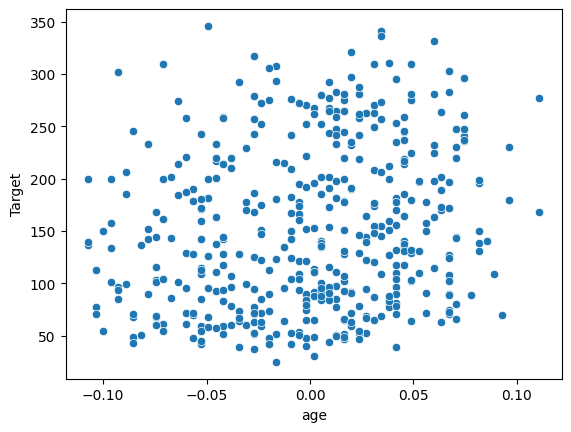

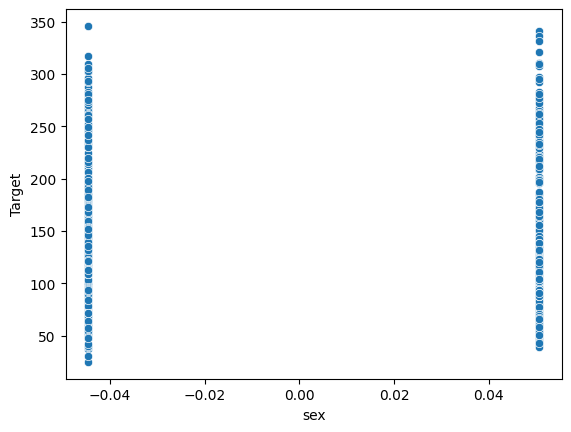

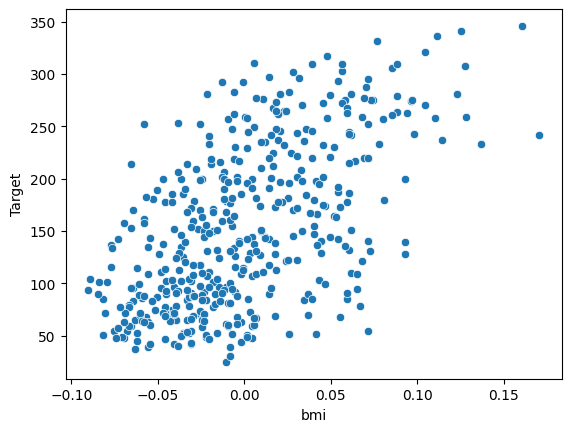

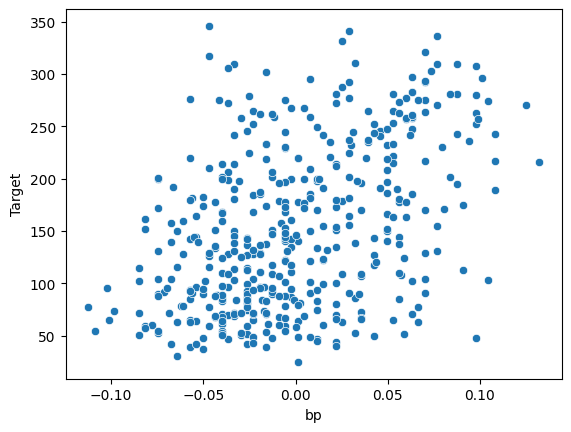

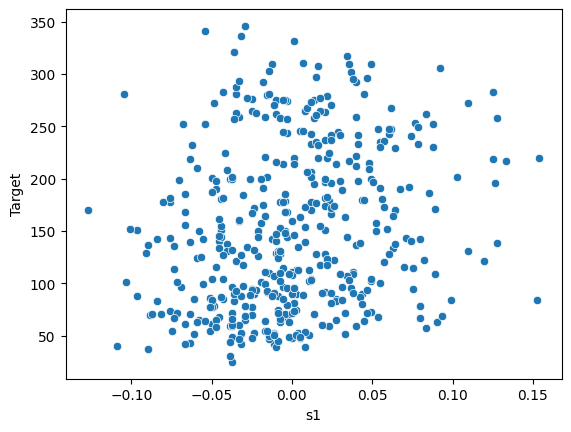

...

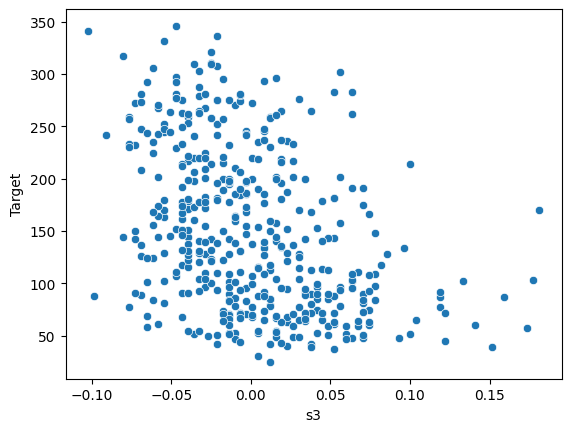

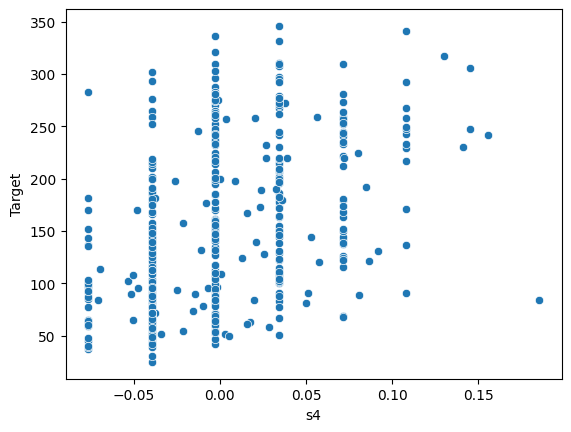

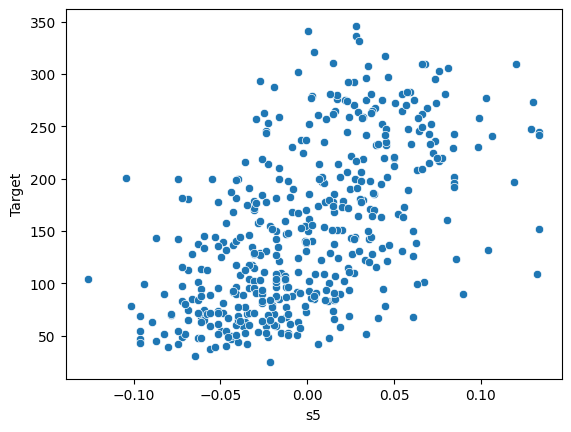

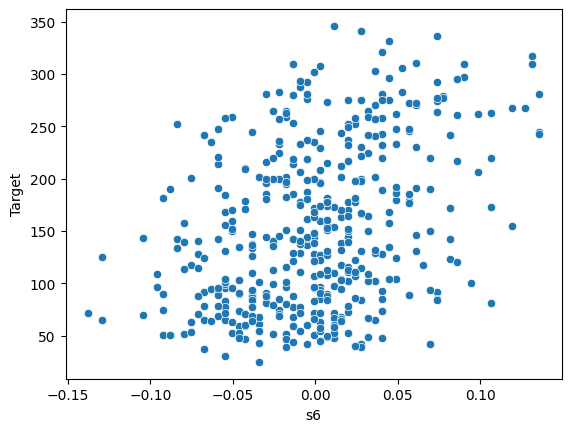

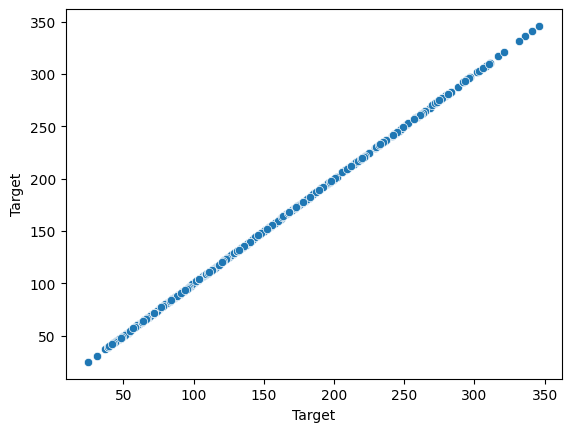

        age       sex       bmi        bp        s1        s2        s3  \
0  0.038076  0.050680  0.061696  0.021872 -0.044223 -0.034821 -0.043401   
1 -0.001882 -0.044642 -0.051474 -0.026328 -0.008449 -0.019163  0.074412   
2  0.085299  0.050680  0.044451 -0.005670 -0.045599 -0.034194 -0.032356   
3 -0.089063 -0.044642 -0.011595 -0.036656  0.012191  0.024991 -0.036038   
4  0.005383 -0.044642 -0.036385  0.021872  0.003935  0.015596  0.008142   

         s4        s5        s6  
0 -0.002592  0.019907 -0.017646  
1 -0.039493 -0.068332 -0.092204  
2 -0.002592  0.002861 -0.025930  
3  0.034309  0.022688 -0.009362  
4 -0.002592 -0.031988 -0.046641  
0    151.0
1     75.0
2    141.0
3    206.0
4    135.0
Name: Target, dtype: float64
[[ 0.24396182  1.02582922  0.06364526 ... -0.83072415  0.07510266
   1.49297091]
 [-2.23157066 -0.97482113 -1.56789685 ... -1.59866429 -0.8697201
  -0.10202047]
 [ 0.54402637  1.02582922 -0.70803006 ... -0.062784   -0.30602734
  -1.02543653]
 ...
 [ 1.21917159 

In [10]:
x_train, x_test, y_train, y_test=eda(df_diabetes,'Target',-1)   



In [11]:
def LinearReg(x_train, x_test, y_train, y_test):
    lr1 = LinearRegression()
    lr1.fit(x_train, y_train)
    y_pred = lr1.predict(x_test)
    # print(y_pred)
    # print(y_test)
    print(lr1.coef_)
    print(lr1.intercept_)
    print(lr1.get_params())
    residuals = y_test - y_pred
    sns.displot(residuals,kind='kde')
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
    MSEArray.append(metrics.mean_squared_error(y_test, y_pred))
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
    
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))  
    return y_pred, y_test


[ -1.721465   -11.5856942   27.51069174  14.3712086  -31.22139382
  15.26518393   1.16794747   8.18446857  35.83753415   2.12323129]
151.60623229461757
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 46.17358500370478
Mean Squared Error: 3424.259334298691
Root Mean Squared Error: 58.51717127731561


(array([238.46949509, 248.92812015, 164.05732579, 120.30774826,
        187.42483427, 259.04746969, 113.55788482, 188.07762807,
        149.49521726, 236.00758247, 172.24561893, 178.87936198,
        109.16034679,  92.13333574, 243.32766187,  87.35445583,
        155.72165684,  66.98992013, 100.42233598, 218.0957236 ,
        196.6646301 , 161.2972646 , 161.70870434, 156.52404017,
        197.88770177, 167.58280539, 120.7427979 ,  84.84033238,
        192.03438449, 160.60496231, 175.17348034,  84.22759674,
        145.80002729, 145.97264454, 140.96436257, 197.00423168,
        165.94319214, 190.6597389 , 128.22361933, 206.41497077,
         84.3575017 , 164.02262498, 144.10639773, 184.68996616,
        177.80076449,  74.33261184, 143.36644877, 138.68063137,
        120.80857573, 234.34288711, 161.94132344,  74.54325994,
        154.71683591, 156.78815442, 237.41798756, 174.23210042,
        190.87871793, 118.98140389, 132.20521501, 168.52914416,
        214.73950634, 171.42284128, 157.

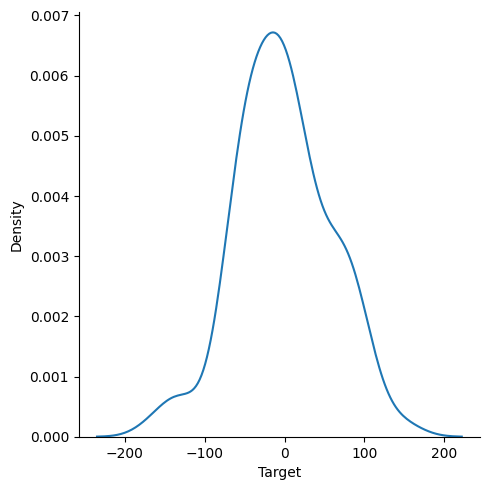

In [12]:
LinearReg(x_train, x_test, y_train, y_test)


In [13]:
from sklearn.datasets import fetch_california_housing
housing = fetch_california_housing()
df_housing = pd.DataFrame(housing.data, columns=housing.feature_names)
df_housing['Target'] = housing.target
df_housing.head()



,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


               MedInc     HouseAge    AveRooms  AveBedrms    Population  \
MedInc       3.609323    -2.846140    1.536568  -0.055858  1.040098e+01   
HouseAge    -2.846140   158.396260   -4.772882  -0.463718 -4.222271e+03   
AveRooms     1.536568    -4.772882    6.121533   0.993868 -2.023337e+02   
AveBedrms   -0.055858    -0.463718    0.993868   0.224592 -3.552723e+01   
Population  10.400979 -4222.270582 -202.333712 -35.527225  1.282470e+06   
AveOccup     0.370289     1.724298   -0.124689  -0.030424  8.217120e+02   
Latitude    -0.323860     0.300346    0.562235   0.070575 -2.631378e+02   
Longitude   -0.057765    -2.728244   -0.136518   0.012670  2.263778e+02   
Target       1.508475     1.533988    0.433826  -0.025539 -3.221249e+01   

              AveOccup    Latitude   Longitude     Target  
MedInc        0.370289   -0.323860   -0.057765   1.508475  
HouseAge      1.724298    0.300346   -2.728244   1.533988  
AveRooms     -0.124689    0.562235   -0.136518   0.433826  
AveBedrms

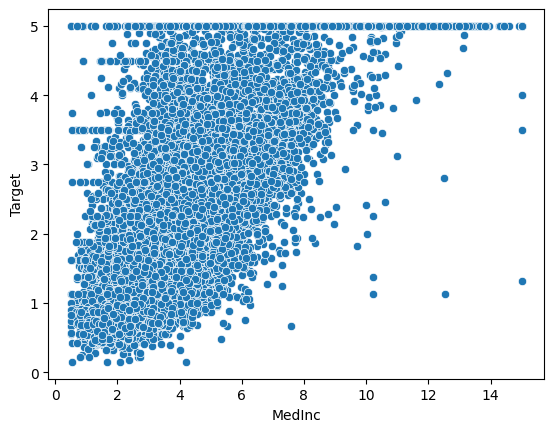

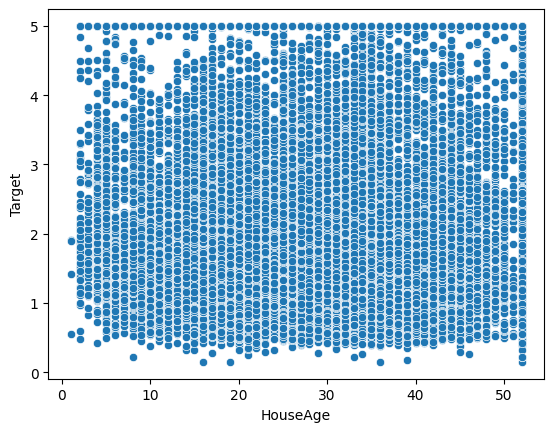

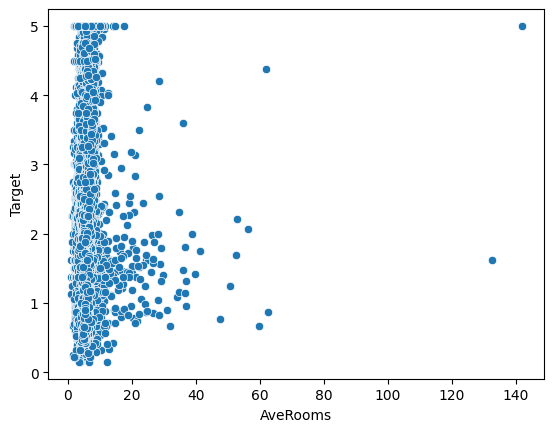

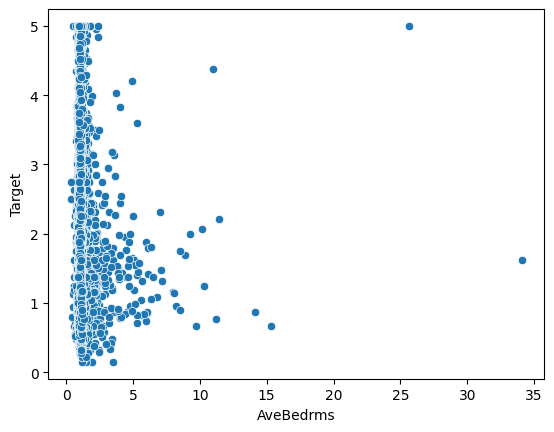

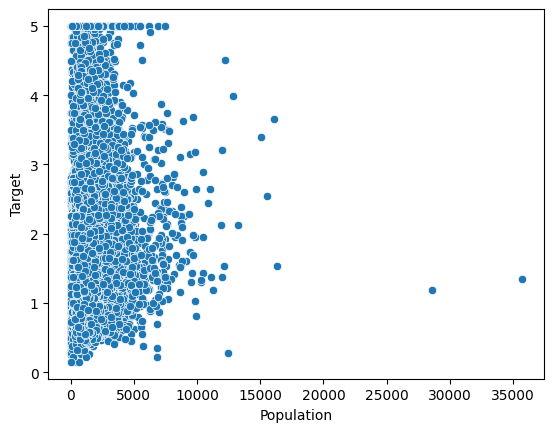

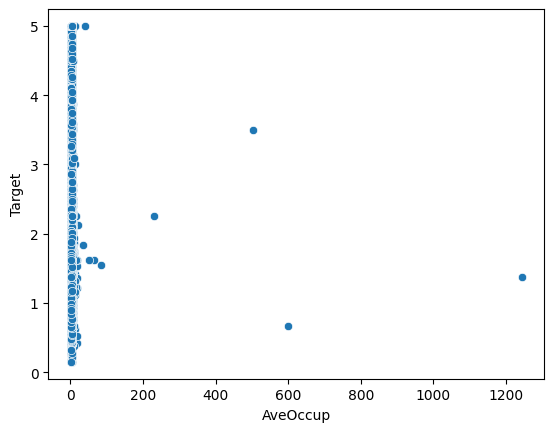

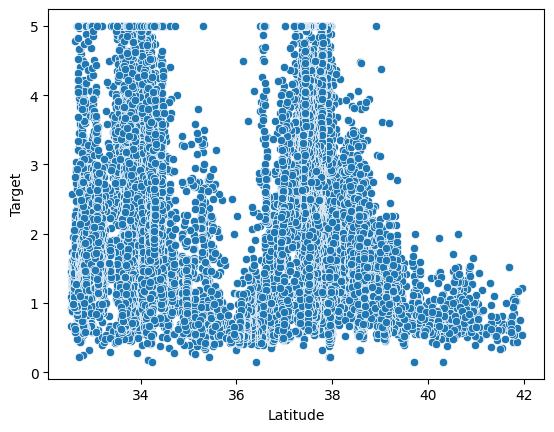

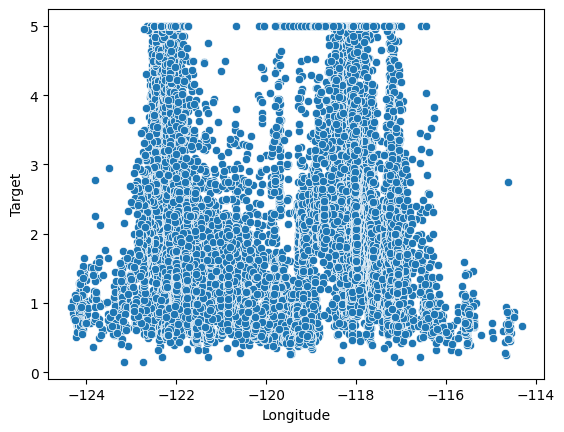

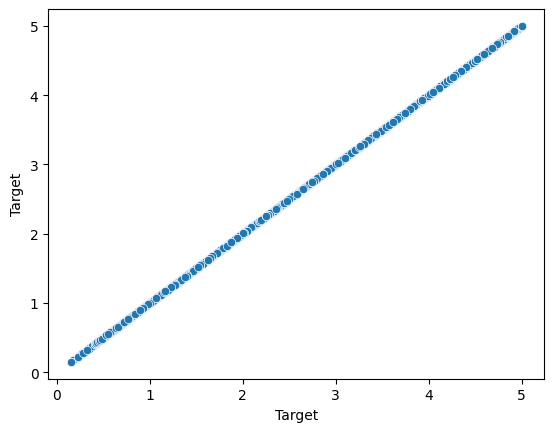

   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  
0    -122.23  
1    -122.22  
2    -122.24  
3    -122.25  
4    -122.25  
0    4.526
1    3.585
2    3.521
3    3.413
4    3.422
Name: Target, dtype: float64
[[ 0.19001247 -1.79507596  0.90771428 ...  0.07408222 -0.8400624
   1.00389865]
 [ 0.26931072  1.85553889 -0.04200187 ...  0.04527606  0.98536392
  -1.43477229]
 [ 0.02989505 -0.20785212 -0.30282448 ... -0.03933216 -0.8400624
   0.77948108]
 ...
 [-0.35589721  0.18895385 -0.70992683 ... -0.19238342  0.44709718
  -1.1654712 ]
 [ 0.92053182  0.42703742 -0.35350337 ... 

In [14]:
x_train, x_test, y_train, y_test=eda(df_housing,'Target',-1)


[ 0.82624793  0.1171006  -0.24891059  0.29038746 -0.00864349 -0.03056429
 -0.90042112 -0.87058566]
2.0724989589389438
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.5351261336554506
Mean Squared Error: 0.5289841670367208
Root Mean Squared Error: 0.7273129773603114


(array([2.28110738, 2.79009128, 1.90332794, ..., 0.8418697 , 2.7984953 ,
        2.21779325]),
 14740    1.369
 10101    2.413
 20566    2.007
 2670     0.725
 15709    4.600
          ...  
 6655     1.695
 3505     2.046
 1919     1.286
 1450     2.595
 4148     1.676
 Name: Target, Length: 4128, dtype: float64)

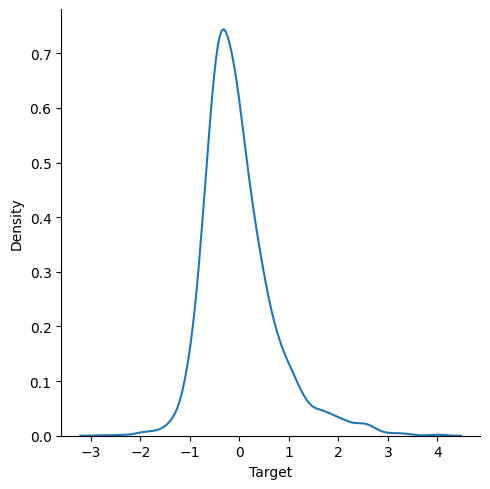

In [15]:
LinearReg(x_train, x_test, y_train, y_test)


In [16]:
from sklearn.datasets import load_iris
iris=load_iris()
df_iris = pd.DataFrame(iris.data, columns=iris.feature_names)
df_iris['Target'] = iris.target  # add target column to the dataframe
df_iris.head()


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),Target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


                   sepal length (cm)  sepal width (cm)  petal length (cm)  \
sepal length (cm)           0.685694         -0.042434           1.274315   
sepal width (cm)           -0.042434          0.189979          -0.329656   
petal length (cm)           1.274315         -0.329656           3.116278   
petal width (cm)            0.516271         -0.121639           1.295609   
Target                      0.530872         -0.152349           1.372483   

                   petal width (cm)    Target  
sepal length (cm)          0.516271  0.530872  
sepal width (cm)          -0.121639 -0.152349  
petal length (cm)          1.295609  1.372483  
petal width (cm)           0.581006  0.597315  
Target                     0.597315  0.671141  


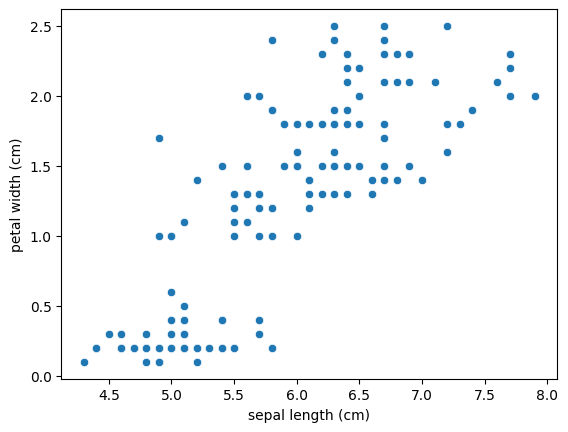

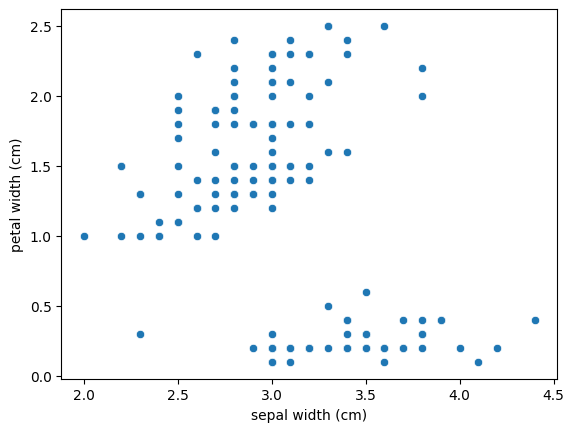

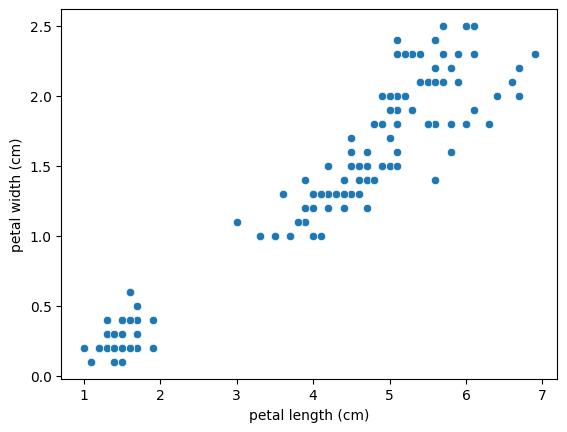

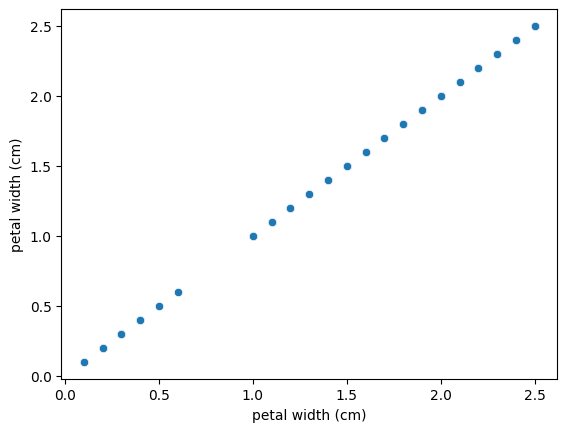

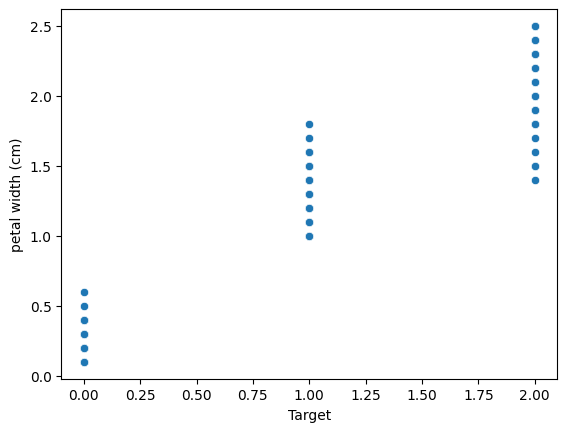

   sepal length (cm)  sepal width (cm)  petal length (cm)  Target
0                5.1               3.5                1.4       0
1                4.9               3.0                1.4       0
2                4.7               3.2                1.3       0
3                4.6               3.1                1.5       0
4                5.0               3.6                1.4       0
0    0.2
1    0.2
2    0.2
3    0.2
4    0.2
Name: petal width (cm), dtype: float64
[[ 0.61303014  0.10850105  0.94751783  1.15375582]
 [-0.56776627 -0.12400121  0.38491447 -0.0501633 ]
 [-0.80392556  1.03851009 -1.30289562 -1.25408241]
 [ 0.25879121 -0.12400121  0.60995581  1.15375582]
 [ 0.61303014 -0.58900572  1.00377816  1.15375582]
 [-0.80392556 -0.82150798  0.04735245 -0.0501633 ]
 [-0.21352735  1.73601687 -1.19037495 -1.25408241]
 [ 0.14071157 -0.82150798  0.72247648 -0.0501633 ]
 [ 0.02263193 -0.12400121  0.21613346 -0.0501633 ]
 [-0.09544771 -1.05401024  0.10361279 -0.0501633 ]
 [ 1.08534

In [17]:
x_train, x_test, y_train, y_test=eda(df_iris,'petal width (cm)')  


[-0.10295459  0.07630008  0.59712324  0.28273032]
1.2316666666666662
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.13646958210780558
Mean Squared Error: 0.038366503005384765
Root Mean Squared Error: 0.1958736914580025


(array([1.95416151, 1.11348584, 0.31523124, 2.19268109, 0.26769026,
        2.28442621, 0.21824149, 1.42320791, 1.3914256 , 1.20776865,
        2.05018288, 1.41022967, 1.44292913, 1.36070742, 1.46066908,
        0.28173263, 1.40563721, 1.37960723, 0.18744982, 0.2405739 ,
        1.91128649, 1.47200451, 0.42638136, 0.21833724, 1.80475109,
        0.18382574, 0.4608706 , 1.31413482, 1.01763372, 0.30128462]),
 114    2.4
 62     1.0
 33     0.2
 107    1.8
 7      0.2
 100    2.5
 40     0.3
 86     1.5
 76     1.4
 71     1.3
 134    1.4
 51     1.5
 73     1.2
 54     1.5
 63     1.4
 37     0.1
 78     1.5
 90     1.2
 45     0.3
 16     0.4
 121    2.0
 66     1.5
 24     0.2
 8      0.2
 126    1.8
 22     0.2
 44     0.4
 97     1.3
 93     1.0
 26     0.4
 Name: petal width (cm), dtype: float64)

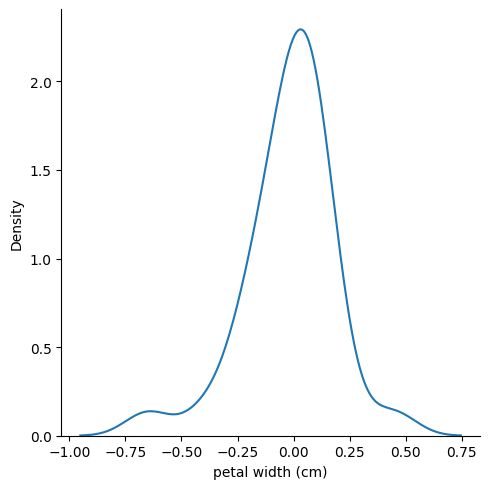

In [18]:
LinearReg(x_train, x_test, y_train, y_test)


In [19]:
from sklearn.datasets import load_wine
wine=load_wine()


In [20]:
df_wine = pd.DataFrame(wine.data, columns=wine.feature_names)
 # add target column to the dataframe
df_wine.head()


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0


                                 alcohol  malic_acid        ash  \
alcohol                         0.659062    0.085611   0.047115   
malic_acid                      0.085611    1.248015   0.050277   
ash                             0.047115    0.050277   0.075265   
alcalinity_of_ash              -0.841093    1.076332   0.406208   
magnesium                       3.139878   -0.870780   1.122937   
total_phenols                   0.146887   -0.234338   0.022146   
flavanoids                      0.192033   -0.458630   0.031535   
nonflavanoid_phenols           -0.015754    0.040733   0.006358   
proanthocyanins                 0.063518   -0.141147   0.001516   
color_intensity                 1.028283    0.644838   0.164654   
hue                            -0.013313   -0.143326  -0.004682   
od280/od315_of_diluted_wines    0.041698   -0.292447   0.000762   
proline                       164.567185  -67.548867  19.319739   

                              alcalinity_of_ash    magnesium 

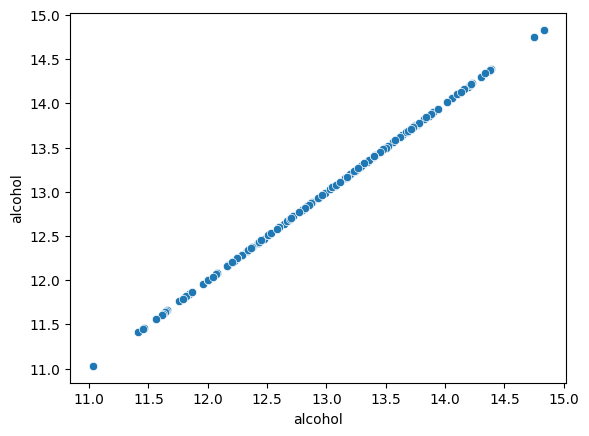

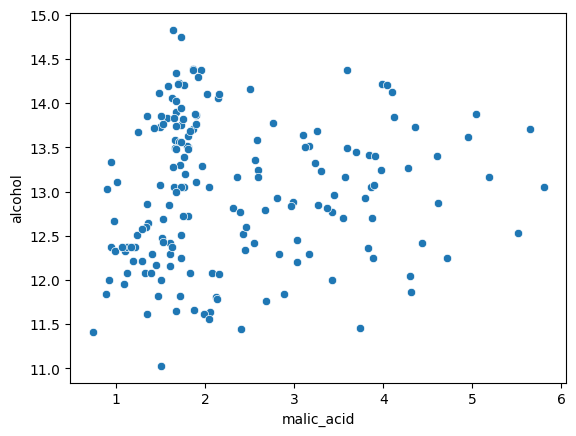

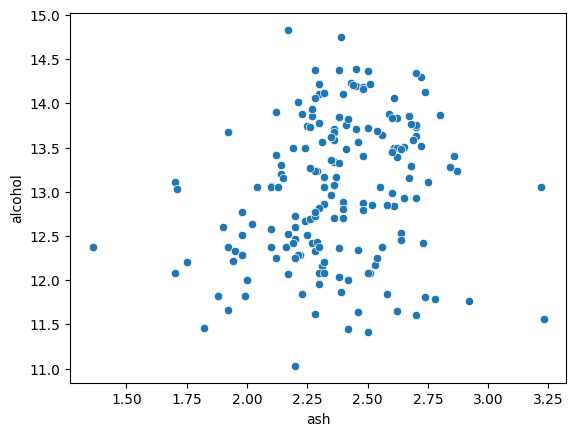

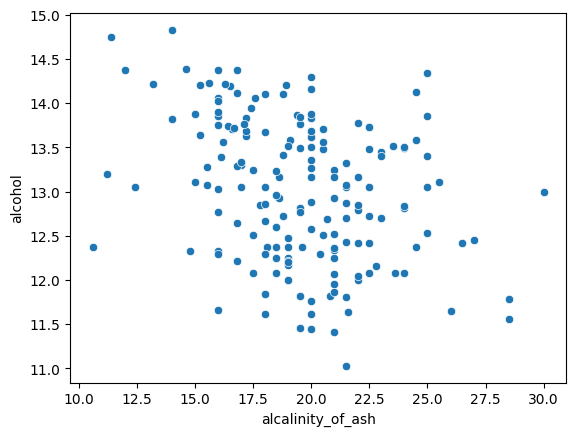

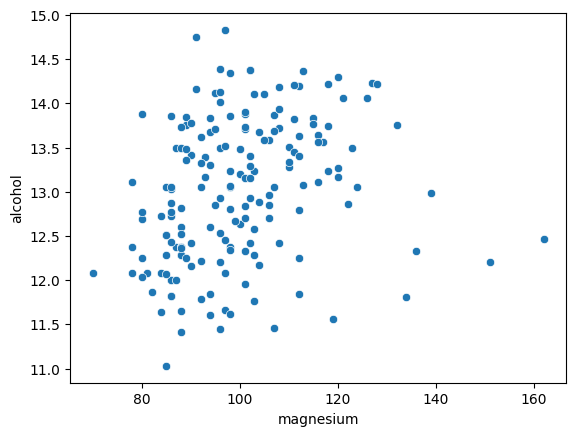

...

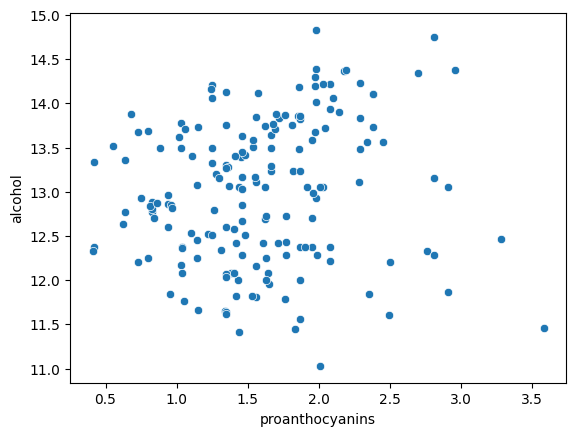

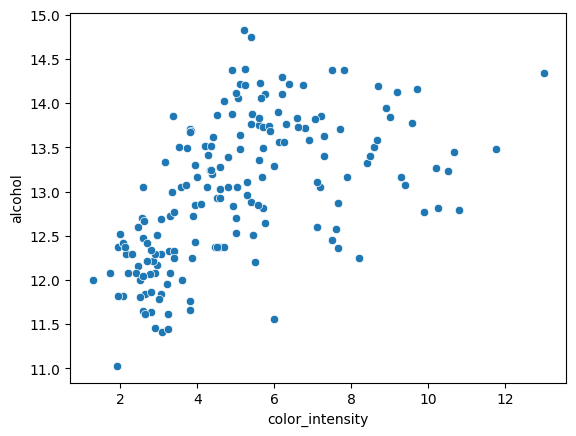

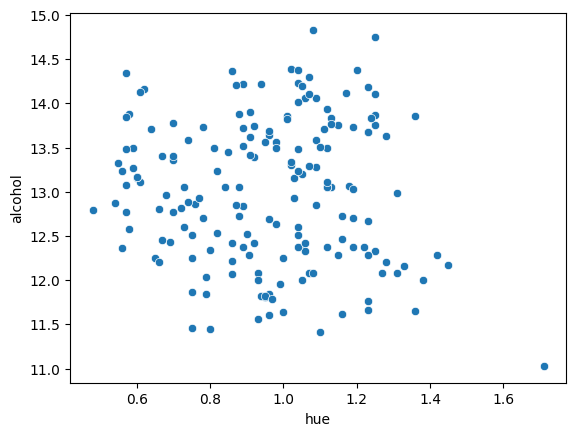

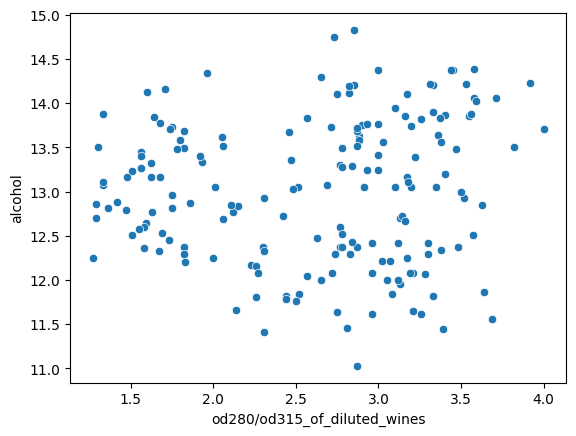

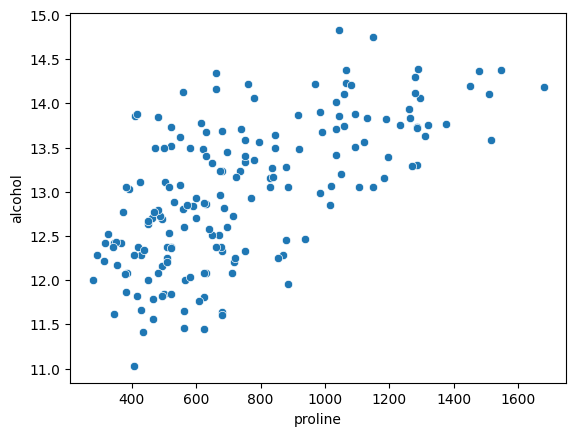

   malic_acid   ash  alcalinity_of_ash  magnesium  total_phenols  flavanoids  \
0        1.71  2.43               15.6      127.0           2.80        3.06   
1        1.78  2.14               11.2      100.0           2.65        2.76   
2        2.36  2.67               18.6      101.0           2.80        3.24   
3        1.95  2.50               16.8      113.0           3.85        3.49   
4        2.59  2.87               21.0      118.0           2.80        2.69   

   nonflavanoid_phenols  proanthocyanins  color_intensity   hue  \
0                  0.28             2.29             5.64  1.04   
1                  0.26             1.28             4.38  1.05   
2                  0.30             2.81             5.68  1.03   
3                  0.24             2.18             7.80  0.86   
4                  0.39             1.82             4.32  1.04   

   od280/od315_of_diluted_wines  proline  
0                          3.92   1065.0  
1                          3.4

In [21]:
x_train, x_test, y_train, y_test=eda(df_wine,"alcohol")


[ 0.11423491  0.05735224 -0.10531089  0.0446806  -0.0131364   0.21775444
  0.05690744 -0.15666349  0.42101127  0.05115575  0.08839278  0.24272   ]
12.984859154929579
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.43809546115716574
Mean Squared Error: 0.3948207736510064
Root Mean Squared Error: 0.6283476534936742


(array([13.63962961, 13.4920763 , 12.60234333, 13.4102733 , 12.48459613,
        13.65687296, 13.9185171 , 13.10805453, 12.45154253, 12.17566095,
        12.96367496, 12.55701056, 14.22837619, 12.89691184, 13.23876321,
        12.15129457, 13.93785645, 14.87241909, 12.88655295, 13.67419613,
        12.77004938, 13.28323141, 13.16276744, 12.47867416, 12.78563254,
        12.12509354, 12.46784227, 12.14241633, 13.13441085, 13.3480099 ,
        13.69065645, 13.61912127, 12.49709955, 13.81482794, 13.44608074,
        13.22630355]),
 54     13.74
 151    12.79
 63     12.37
 55     13.56
 123    13.05
 121    11.56
 7      14.06
 160    12.36
 106    12.25
 90     12.08
 141    13.36
 146    13.88
 5      14.20
 98     12.37
 168    13.58
 80     12.00
 33     13.76
 18     14.19
 61     12.64
 51     13.83
 66     13.11
 37     13.05
 4      13.24
 104    12.51
 60     12.33
 111    12.52
 126    12.43
 86     12.16
 112    11.76
 164    13.78
 26     13.39
 56     14.22
 129    12.04
 45 

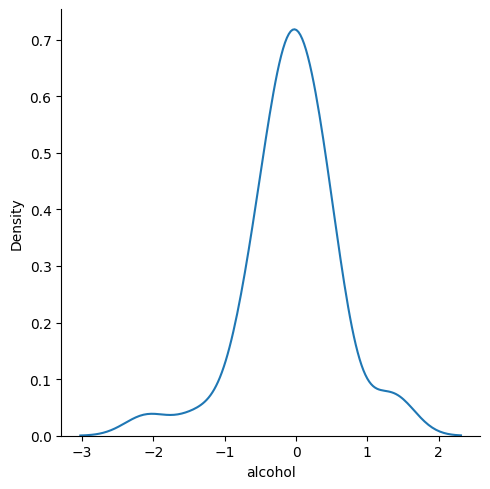

In [22]:
LinearReg(x_train, x_test, y_train, y_test)


In [23]:
from sklearn.datasets import load_breast_cancer
cancer=load_breast_cancer()
df_cancer = pd.DataFrame(cancer.data, columns=cancer.feature_names)
df_cancer['Target'] = cancer.target  # add target column to the dataframe
df_cancer.head()


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


                         mean radius  mean texture  mean perimeter  \
mean radius                12.418920      4.907582       85.447142   
mean texture                4.907582     18.498909       34.439759   
mean perimeter             85.447142     34.439759      590.440480   
mean area                1224.483409    485.993787     8435.772345   
mean smoothness             0.008454     -0.001415        0.070836   
mean compactness            0.094197      0.053767        0.714714   
mean concavity              0.190128      0.103692        1.387234   
mean concave points         0.112475      0.048977        0.802360   
mean symmetry               0.014273      0.008419        0.121922   
mean fractal dimension     -0.007754     -0.002321       -0.044859   
radius error                0.663650      0.329037        4.661401   
texture error              -0.189189      0.916695       -1.162988   
perimeter error             4.803550      2.449449       34.053028   
area error          

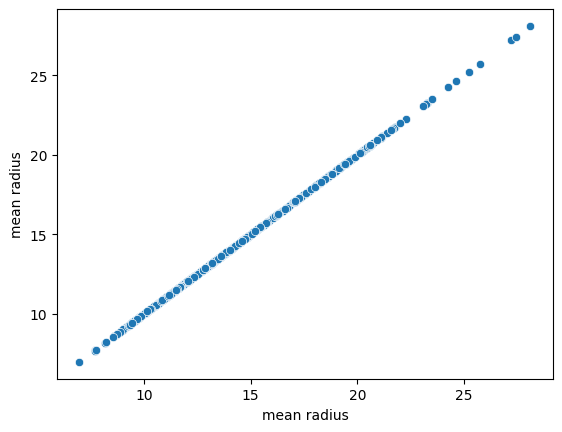

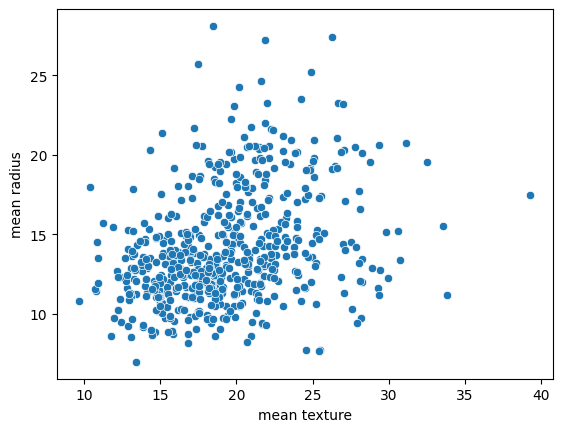

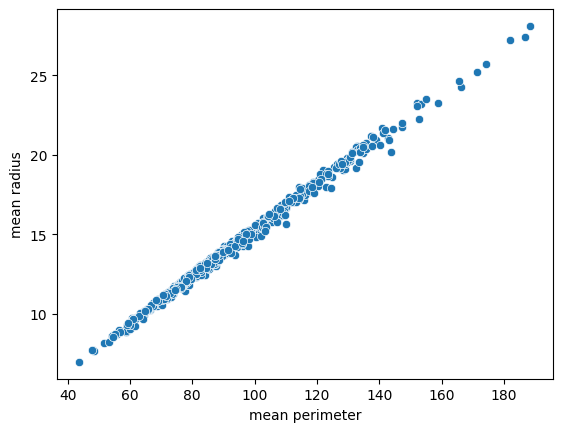

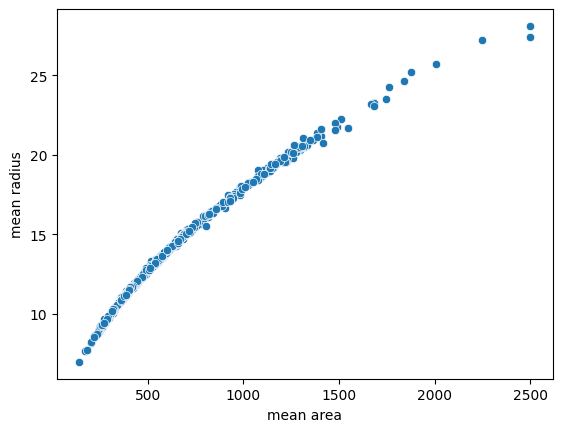

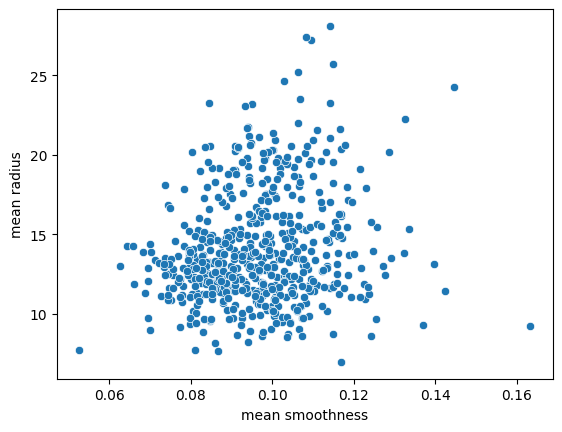

...

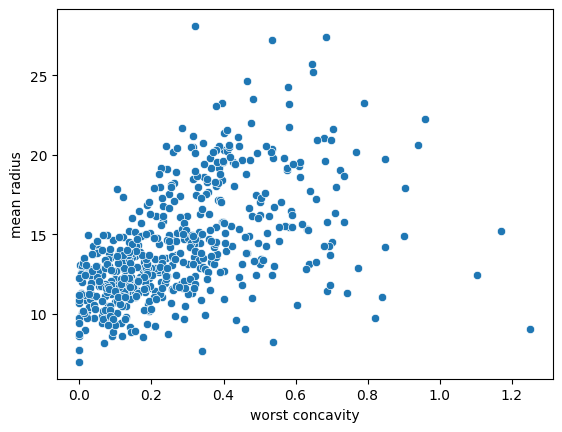

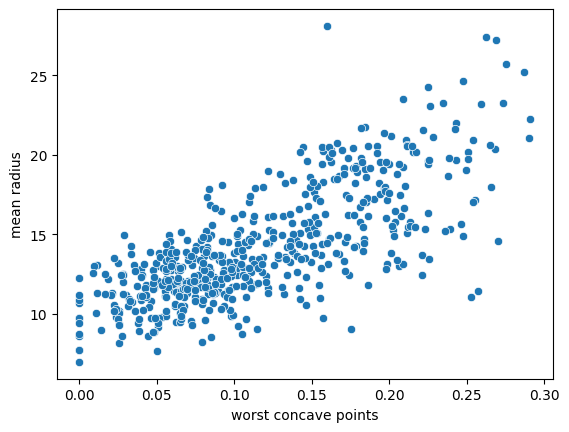

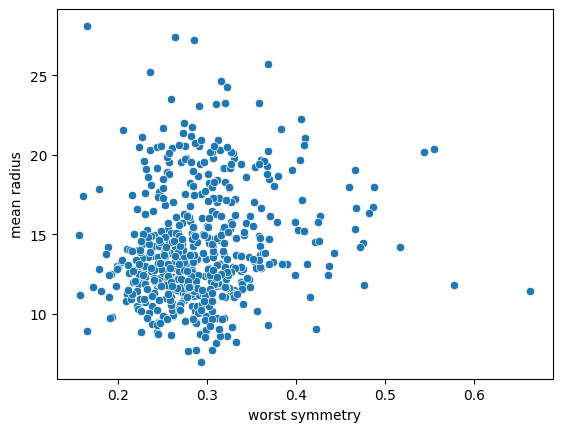

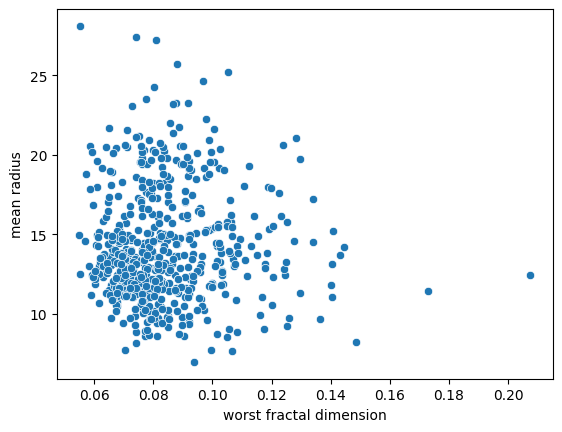

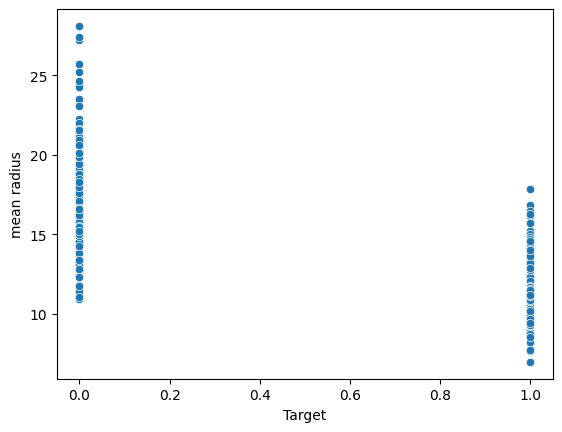

   mean texture  mean perimeter  mean area  mean smoothness  mean compactness  \
0         10.38          122.80     1001.0          0.11840           0.27760   
1         17.77          132.90     1326.0          0.08474           0.07864   
2         21.25          130.00     1203.0          0.10960           0.15990   
3         20.38           77.58      386.1          0.14250           0.28390   
4         14.34          135.10     1297.0          0.10030           0.13280   

   mean concavity  mean concave points  mean symmetry  mean fractal dimension  \
0          0.3001              0.14710         0.2419                 0.07871   
1          0.0869              0.07017         0.1812                 0.05667   
2          0.1974              0.12790         0.2069                 0.05999   
3          0.2414              0.10520         0.2597                 0.09744   
4          0.1980              0.10430         0.1809                 0.05883   

   radius error  ...  wors

In [24]:
x_train, x_test, y_train, y_test=eda(df_cancer,'mean radius')


[-1.42743625e-03  3.39966151e+00  1.96389150e-01  9.74499893e-03
 -1.78199467e-01 -1.45210367e-01  1.89490242e-02  7.29531488e-03
  1.56765814e-02  1.50018980e-02  9.34921722e-03 -6.23435800e-02
  1.50888307e-02  6.80983114e-03 -1.95036283e-02  4.76195033e-02
  1.46292844e-02  8.50495230e-03 -6.62767684e-03  7.53997847e-01
 -8.77119461e-03 -3.60375534e-01 -2.72516698e-01 -9.00300171e-03
  3.87503489e-02  2.19577157e-02 -1.53288099e-02 -5.84464905e-03
 -2.00118914e-03  2.57786932e-03]
14.112498901098899
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.04633296344041117
Mean Squared Error: 0.006095036240118769
Root Mean Squared Error: 0.07807071307551103


(array([13.38450029, 13.17292794, 13.97807012, 14.26269537, 13.02755416,
        11.34423354, 12.00862221, 11.69843081,  7.68614192, 10.29993899,
        14.68000711, 14.65805683,  9.36510402, 16.76646665, 14.586687  ,
        15.47631297,  8.85136394, 20.48079871, 19.53676504, 20.96648991,
        11.88410216, 16.25802746, 13.44770456, 11.82032615, 21.34447265,
        11.9910907 , 10.88215264, 13.70097556, 13.39264244, 18.80735771,
        12.81579297, 20.55345761, 13.13921923, 16.19130906,  9.74417828,
        12.71661105, 13.24842479, 19.01000222, 14.81751306, 15.10172419,
        15.12977412,  8.85673581, 15.98479096, 10.33304169, 13.19405489,
        21.51467164,  8.6780989 , 14.00433   , 11.84354925, 14.5600619 ,
        19.40461588, 14.80756298, 18.47577812, 11.5735828 , 12.39866225,
        11.45718926, 11.27831   , 12.24984982, 12.16823581, 21.97145737,
        13.78194556, 16.07553853, 11.13324251, 12.88591558, 17.76502436,
        12.03468278, 22.18854785, 17.41167808, 20.3

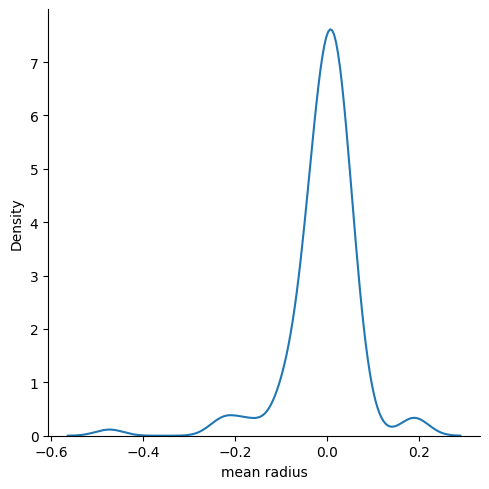

In [25]:
LinearReg(x_train, x_test, y_train, y_test)


In [26]:
from sklearn.datasets import load_linnerud
from sklearn.metrics import mean_squared_error, mean_absolute_error

linnerud=load_linnerud()
df_linnerud = pd.DataFrame(linnerud.data, columns=linnerud.feature_names)
features = pd.DataFrame(linnerud.target, columns=linnerud.target_names)  # Age, Weight, Waist
target = pd.DataFrame(linnerud.data, columns=linnerud.feature_names)  # Chins, Situps, Jumps

# Use age, weight, and waist as features to predict 'chins'
X = features[['Weight', 'Waist']]
y = target['Chins']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")


Mean Squared Error (MSE): 20.11
Mean Absolute Error (MAE): 4.07


[78.46765857 19.36525693 48.24486598 25.37998144  1.85731414 56.99738351
 82.84562705  8.89015787 29.5056921  68.27989528]
0.0017937063271011855
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.07679058090013842
Mean Squared Error: 0.00934881402625134
Root Mean Squared Error: 0.09668926531032977


(array([ -66.43447614,   55.906986  ,  -89.09788461, ..., -202.98484918,
         -79.90124127,  194.3318338 ]),
 array([ -66.34037302,   55.86749697,  -89.05607361, ..., -202.9584964 ,
         -79.82066528,  194.25269266]))

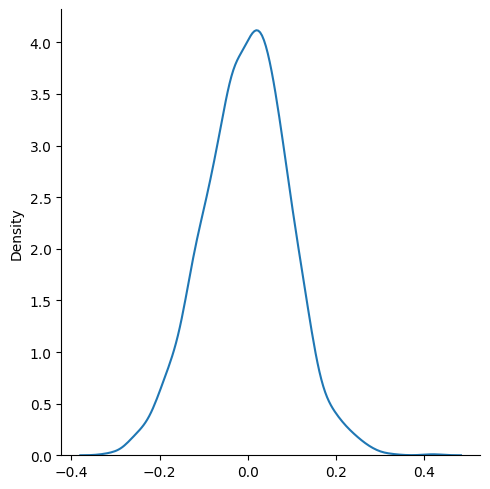

In [27]:
from sklearn.datasets import make_regression
X, y = make_regression(n_samples=10000, n_features=10, noise=0.1, random_state=42)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
LinearReg(X_train, X_test, y_train, y_test)


In [28]:
from sklearn.datasets import load_digits
digits = load_digits()
df_digits = pd.DataFrame(digits.data, columns=digits.feature_names)
df_digits['Target'] = digits.target  # add target column to the dataframe
df_digits.head()


,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7,Target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


           pixel_0_0  pixel_0_1  pixel_0_2  pixel_0_3  pixel_0_4  pixel_0_5  \
pixel_0_0        0.0   0.000000   0.000000   0.000000   0.000000   0.000000   
pixel_0_1        0.0   0.822997   2.400995   0.801020  -0.072969   0.312419   
pixel_0_2        0.0   2.400995  22.608374  11.317044  -1.717201   1.173873   
pixel_0_3        0.0   0.801020  11.317044  18.052657   0.436071  -4.126031   
pixel_0_4        0.0  -0.072969  -1.717201   0.436071  18.381696  12.334882   
...              ...        ...        ...        ...        ...        ...   
pixel_7_4        0.0  -0.458120  -3.161335  -1.382688  -1.737254  -9.817273   
pixel_7_5        0.0  -0.159895  -1.155440  -1.377286  -5.459585  -8.988024   
pixel_7_6        0.0   0.098514   1.412036   0.928746  -4.396696  -6.204002   
pixel_7_7        0.0  -0.074062   0.729880   0.647843  -1.717423  -1.767883   
Target           0.0  -0.134736  -0.161259  -0.139871   1.238304   3.139421   

           pixel_0_6  pixel_0_7  pixel_1_0  pixel_1

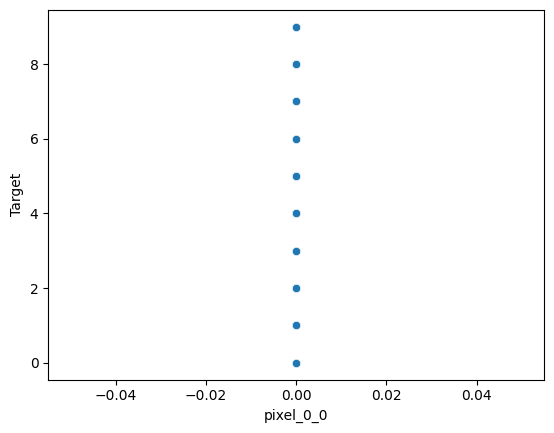

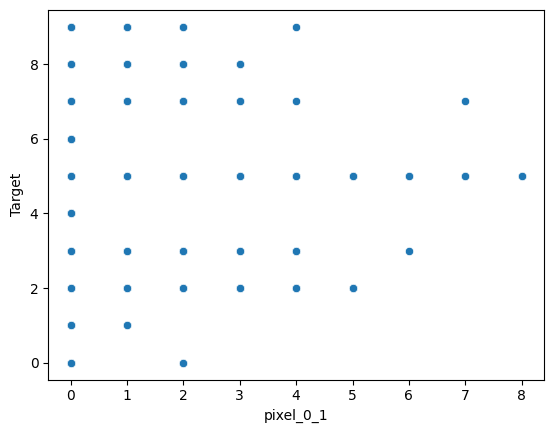

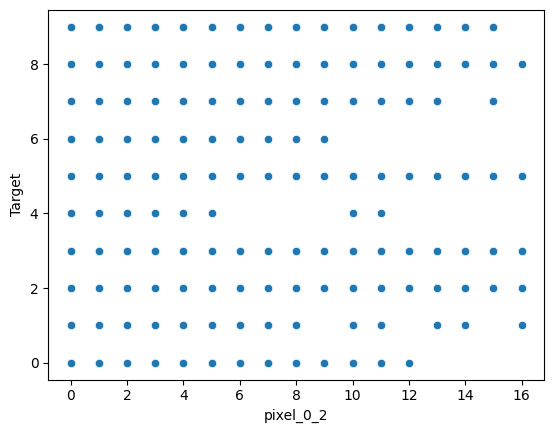

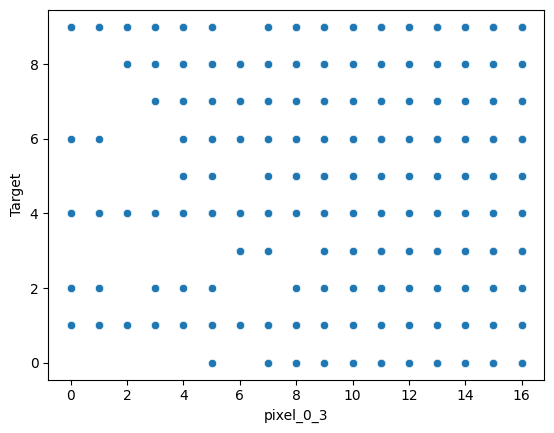

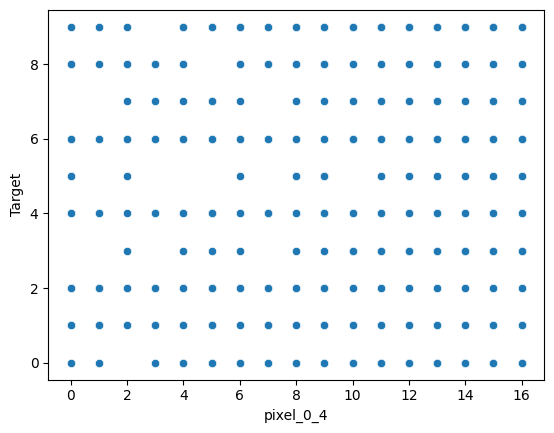

...

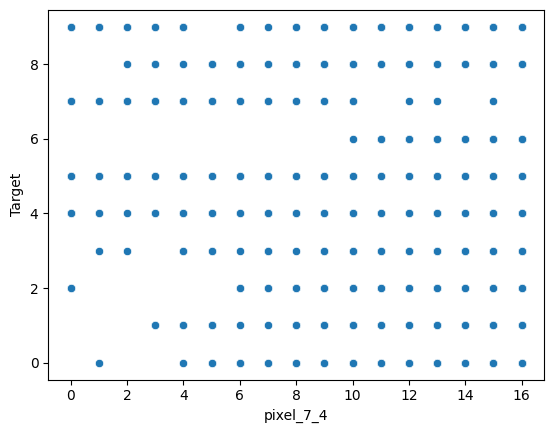

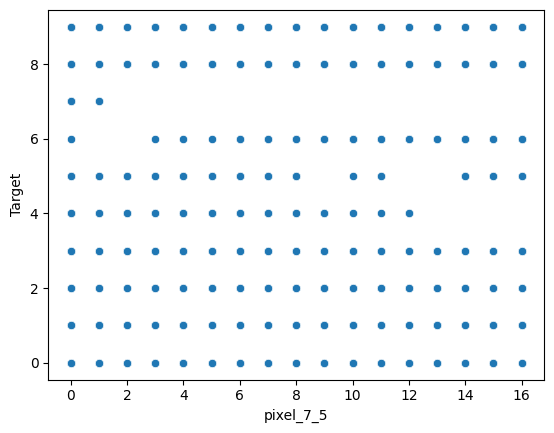

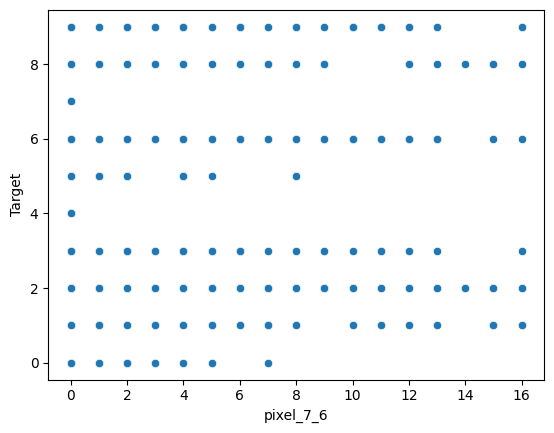

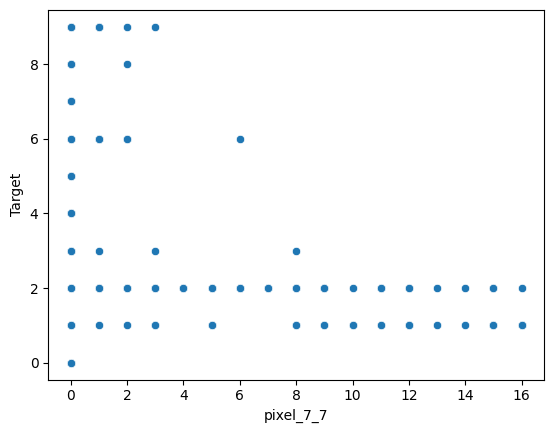

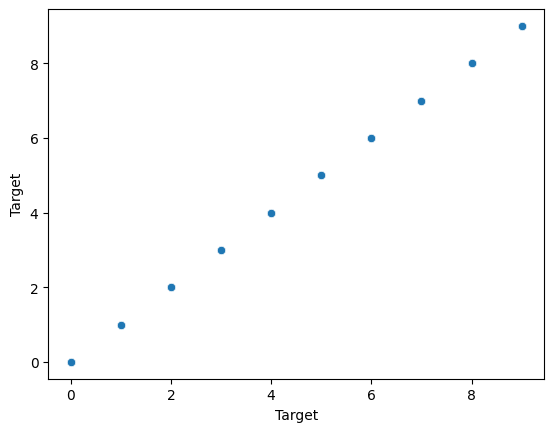

   pixel_0_0  pixel_0_1  pixel_0_2  pixel_0_3  pixel_0_4  pixel_0_5  \
0        0.0        0.0        5.0       13.0        9.0        1.0   
1        0.0        0.0        0.0       12.0       13.0        5.0   
2        0.0        0.0        0.0        4.0       15.0       12.0   
3        0.0        0.0        7.0       15.0       13.0        1.0   
4        0.0        0.0        0.0        1.0       11.0        0.0   

   pixel_0_6  pixel_0_7  pixel_1_0  pixel_1_1  ...  pixel_6_6  pixel_6_7  \
0        0.0        0.0        0.0        0.0  ...        0.0        0.0   
1        0.0        0.0        0.0        0.0  ...        0.0        0.0   
2        0.0        0.0        0.0        0.0  ...        5.0        0.0   
3        0.0        0.0        0.0        8.0  ...        9.0        0.0   
4        0.0        0.0        0.0        0.0  ...        0.0        0.0   

   pixel_7_0  pixel_7_1  pixel_7_2  pixel_7_3  pixel_7_4  pixel_7_5  \
0        0.0        0.0        6.0       13.0

In [29]:
x_train, x_test, y_train, y_test=eda(df_digits,'Target')    


[ 5.26898056e-17  1.10447954e-01 -6.25753904e-02 -6.09950120e-02
  2.90588159e-01 -1.61448673e-02 -1.18107517e-01 -1.71665265e-02
  6.21211705e-02 -5.96750966e-02  5.93077139e-01  1.25391413e-01
 -3.24096646e-01 -4.16335254e-01  3.45069408e-01  1.76506272e-01
  4.24957381e-02  4.95496450e-02  4.80453041e-01 -2.04410039e-01
 -4.24127185e-01  2.54847247e-01 -1.62531900e-01 -1.23177562e-01
  4.77872273e-03 -4.88663381e-01  2.68498093e-01  5.22481445e-01
  4.42053006e-01  4.89724833e-01 -4.22699307e-02 -1.26696448e-01
 -2.77555756e-16 -5.36759076e-01 -1.60886134e-01  8.06767611e-01
 -2.56535674e-01  1.72488942e-01  4.37878411e-02 -2.22044605e-16
 -8.60599303e-03  3.24470413e-01 -8.08443941e-02 -4.26583484e-02
  7.29638345e-01  3.17701443e-01 -3.66701215e-02  4.17520170e-02
  1.30695194e-01  1.15938933e-01 -9.12959333e-02 -3.03696241e-01
 -1.08764200e+00 -2.42236820e-01  5.35089450e-01 -1.36608736e-01
 -4.11071260e-02 -1.51327545e-01  3.09671403e-02 -3.64464734e-01
 -2.98049041e-02 -4.18630

(array([ 1.45937706e+00,  7.12712235e+00,  2.13001151e+00,  5.82048326e+00,
         4.18204807e+00,  5.09427570e+00,  2.02342834e+00,  6.17248758e+00,
         7.62587862e+00,  5.45541138e+00,  2.62098418e+00,  4.43712982e+00,
         6.51219256e+00,  5.03315945e+00,  4.86604715e+00,  6.18499925e+00,
         8.62491880e-01,  7.74416491e-01,  4.34979374e+00,  9.48894922e+00,
         9.12509693e+00,  5.93381610e+00,  7.91389939e+00,  3.87079008e+00,
         7.73345282e+00,  3.97422202e+00,  4.01264650e+00,  8.51410110e+00,
         3.24702703e+00,  8.25716438e+00,  4.10028587e+00,  5.66018061e+00,
         4.84563178e+00,  3.80615543e+00,  6.67215817e+00,  4.14552257e+00,
         4.80567650e+00,  4.45950265e+00,  1.28862938e+00,  2.32432274e+00,
         6.34115472e+00,  4.44958732e+00,  6.96683142e+00,  7.67587608e+00,
         4.48385870e+00,  2.42892689e+00,  4.86040367e+00,  3.26871063e+00,
         3.30768607e+00,  3.15688423e+00,  6.24298798e+00,  5.85151116e+00,
         6.1

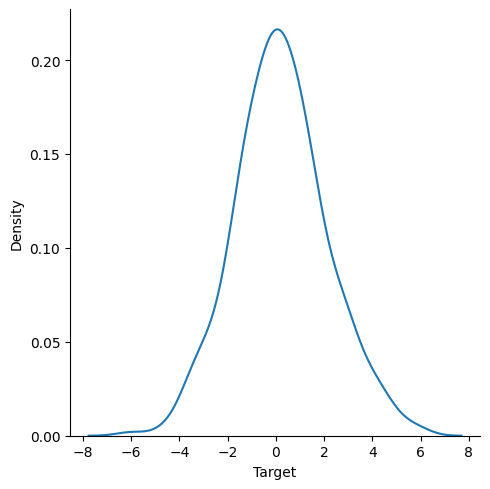

In [30]:
LinearReg(x_train, x_test, y_train, y_test)


In [31]:
titanic_data = sns.load_dataset('titanic')
titanic_data.head()
titanic_data=titanic_data.select_dtypes(exclude=['object'])


In [32]:
titanic_data.head()
titanic_data['adult_male'] = titanic_data['adult_male'].map({'false': 0, 'True': 1})
titanic_data['alone'] = titanic_data['alone'].map({'false': 0, 'True': 1})
titanic_data['class']=titanic_data['class'].map({'First': 1, 'Second': 2, 'Third': 3})


In [33]:
airquality_data = pd.read_csv('Air_Quality Missing Data.csv')
airquality_data.head()
airquality_data.dropna(inplace=True)
airquality_data.drop(columns=['Date'],inplace=True)


             Ozone        Solar       Wind        Temp
Ozone  1107.290090  1056.583456 -72.511237  221.520721
Solar  1056.583456  8308.742179 -41.244799  255.467649
Wind    -72.511237   -41.244799  12.657324  -16.857166
Temp    221.520721   255.467649 -16.857166   90.820311


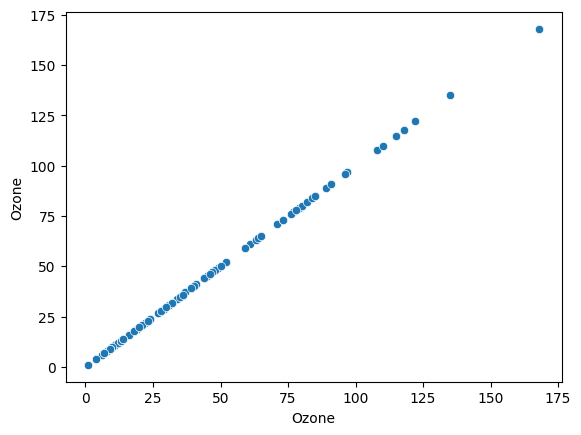

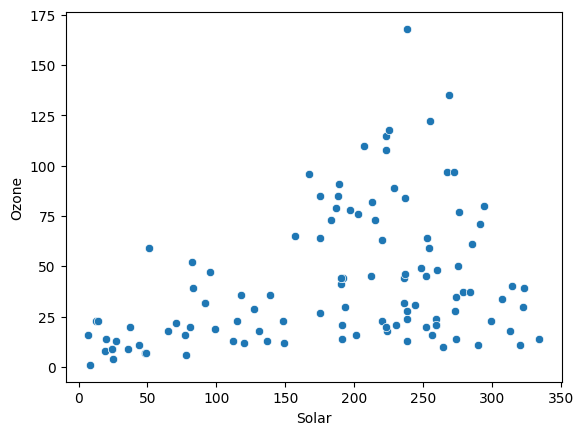

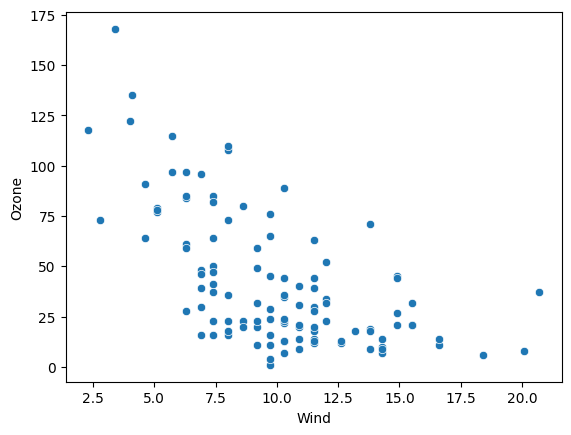

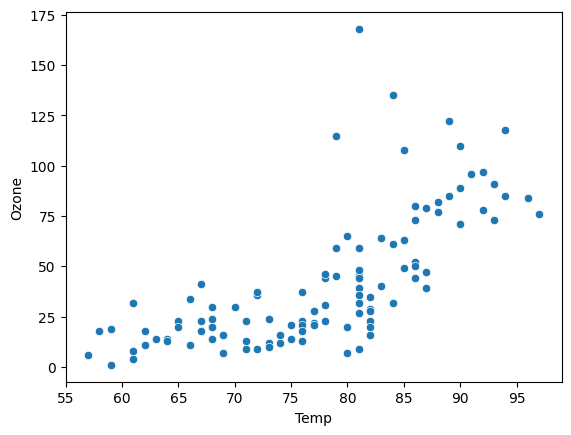

   Solar  Wind  Temp
0  190.0   7.4    67
1  118.0   8.0    72
2  149.0  12.6    74
3  313.0  11.5    62
6  299.0   8.6    65
0    41.0
1    36.0
2    12.0
3    18.0
6    23.0
Name: Ozone, dtype: float64
[[-1.24870836 -0.78122838  0.26186301]
 [ 0.8962028  -1.56628007  0.57753349]
 [ 1.40360113  0.50849939 -1.73738337]
 [-1.97521052  1.93841496 -1.63215987]
 [-1.11032699 -0.64104058  0.89320397]
 [-1.77917026 -0.1363645  -1.42171289]
 [-1.9867423   2.91972957 -1.84260686]
 [-0.0494032  -1.28590447  0.89320397]
 [ 0.78088499  0.0038233  -0.57992494]
 [-1.64078889  0.17204867 -1.00081891]
 [-0.91428673  0.50849939 -0.79037192]
 [ 0.78088499  1.6300018  -0.15903096]
 [ 0.96539348 -0.64104058  0.78798048]
 [-0.49914263 -0.47281522  0.36708651]
 [-1.91755162  0.0038233  -1.84260686]
 [ 0.43493158  0.17204867  1.20887446]
 [ 0.3657409  -0.47281522  0.68275699]
 [ 0.13510529  0.0038233   1.94543891]
 [-0.2800388  -0.78122838  1.31409795]
 [-0.02633963 -1.42609227  1.52454494]
 [ 0.3657409   0

In [34]:
x_train, x_test, y_train, y_test=eda(airquality_data,'Ozone')


[ 4.11513676 -9.24026781 18.05772699]
44.25000000000001
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 20.53554381200606
Mean Squared Error: 863.7970328411312
Root Mean Squared Error: 29.390424169125755


(array([ 30.09231199,  -9.81931417,  67.4819167 ,  26.12289485,
         47.79282745,  11.34540559,  59.45831367,  29.21324096,
         -1.55653389,  36.27110271,  43.05129294,  57.01118464,
         34.69868588,  66.16799668,  51.3787998 ,  47.29903252,
        -24.57437561,  12.55603456,  37.59343193,  30.38282324,
         18.89501443,  26.42178744,  61.93112214]),
 140     13.0
 14      18.0
 116    168.0
 2       12.0
 37      29.0
 143     13.0
 76      48.0
 11      16.0
 20       1.0
 131     21.0
 130     23.0
 29     115.0
 73      27.0
 84      80.0
 94      16.0
 87      52.0
 17       6.0
 113      9.0
 133     44.0
 93       9.0
 136      9.0
 12      11.0
 40      39.0
 Name: Ozone, dtype: float64)

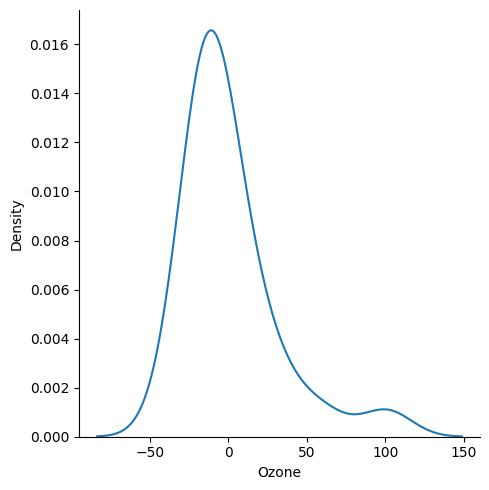

In [35]:
LinearReg(x_train, x_test, y_train, y_test)


In [36]:
AutoMPG = pd.read_csv('MPG.csv')  
AutoMPG.head()


,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    int64  
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(8), int64(3), object(2)
memory usage: 52.6+ KB
              X          Y        FFMC           DMC            DC  \
X      5.353568   1.535401   -0.268720     -7.170019    -49.313282   
Y      1.535401   1.512655   -0.314391      0.612960    -30.869004   
FFMC  -0.268720  -0.314391   30.471624    135.272459    452.587277 

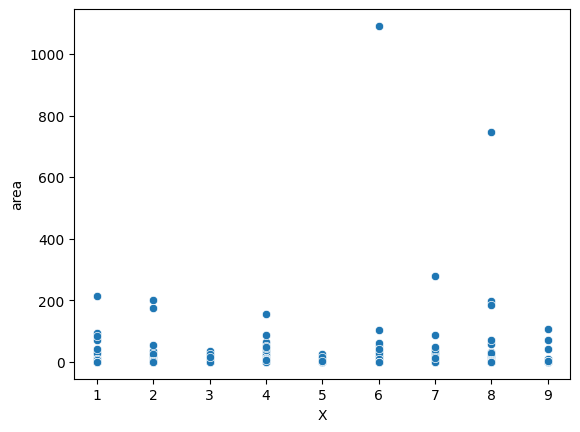

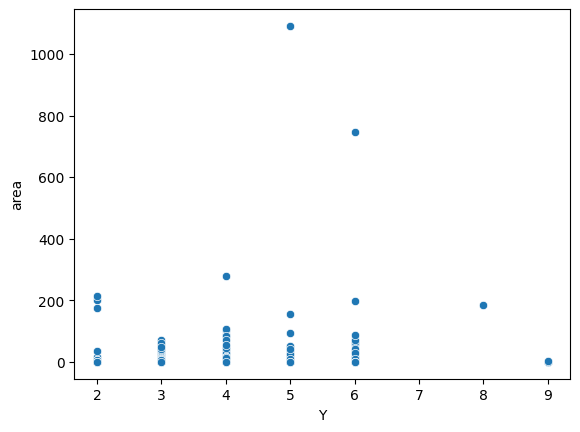

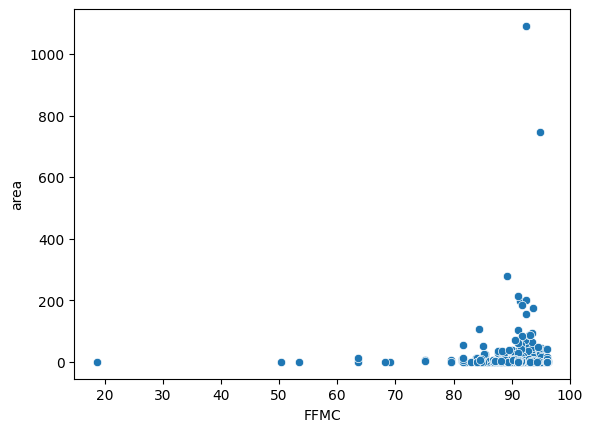

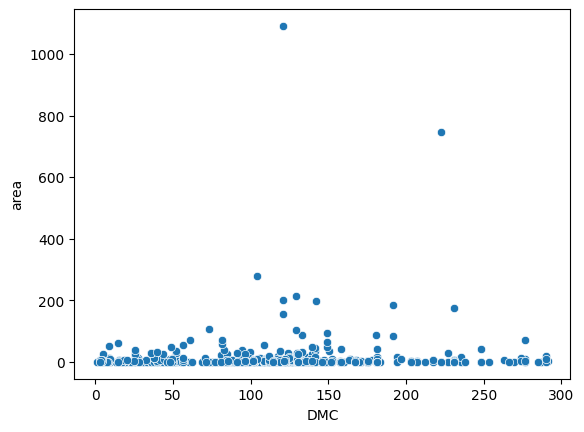

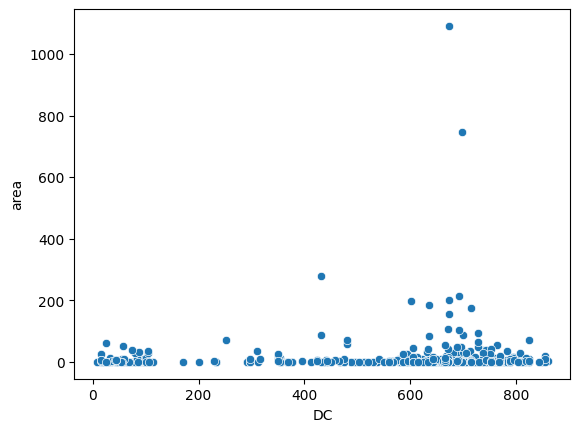

...

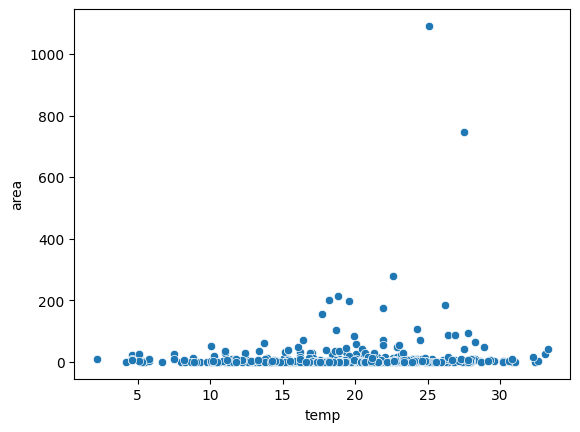

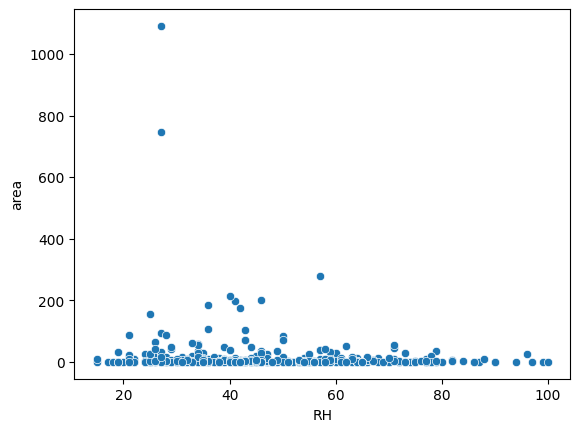

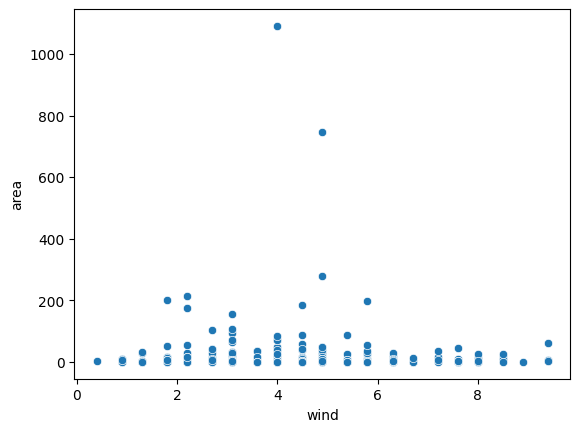

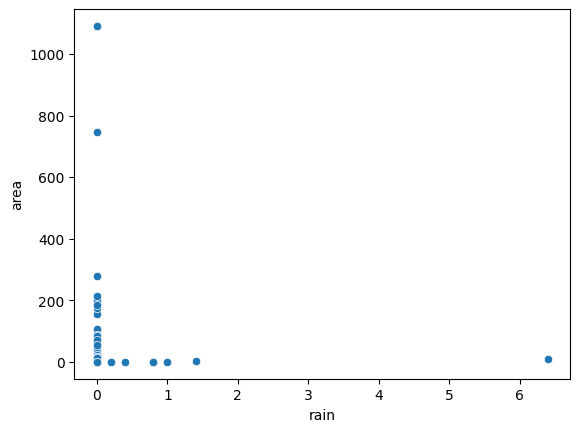

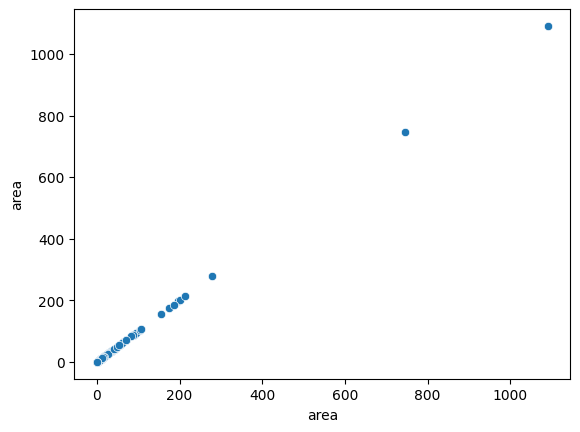

   X  Y  FFMC   DMC     DC  ISI  temp  RH  wind  rain
0  7  5  86.2  26.2   94.3  5.1   8.2  51   6.7   0.0
1  7  4  90.6  35.4  669.1  6.7  18.0  33   0.9   0.0
2  7  4  90.6  43.7  686.9  6.7  14.6  33   1.3   0.0
3  8  6  91.7  33.3   77.5  9.0   8.3  97   4.0   0.2
4  8  6  89.3  51.3  102.2  9.6  11.4  99   1.8   0.0
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: area, dtype: float64
[[-0.69046229 -0.23274839 -0.02655293 ...  0.66067453  0.77617805
  -0.07126589]
 [-0.25905393 -1.0543303  -0.06158922 ...  1.14554095  0.49997477
  -0.07126589]
 [-1.55327901 -0.23274839  0.18366482 ...  0.35763301  0.00280885
  -0.07126589]
 ...
 [ 1.03517115  0.58883352  0.32380998 ... -0.24845002  0.00280885
  -0.07126589]
 [-1.55327901 -0.23274839  0.32380998 ... -0.30905832 -0.99152299
  -0.07126589]
 [-1.12187065 -1.87591221  0.72672733 ... -1.33939947  0.27901213
  -0.07126589]]
[[ 1.03517115 -1.0543303  -0.53457915 ...  0.1151998   0.99714068
  -0.07126589]
 [-1.12187065  0.58883352  0.02

In [37]:
ForestFires = pd.read_csv('forestfires.csv')
ForestFires.head()
ForestFires.info()
ForestFires.drop(columns=['month','day'],inplace=True)
x_train, x_test, y_train, y_test=eda(ForestFires,'area')


[ 3.14025725  1.25941803 -0.55997089  6.62368766 -3.13424672 -1.4331132
  2.39064483 -2.94146841  1.64685463 -0.65564106]
10.344140435835348
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 25.758747927985592
Mean Squared Error: 12086.041002956192
Root Mean Squared Error: 109.93653170332504


(array([11.33715094,  6.77855207, 13.722784  , 16.92916718, 13.34456007,
        15.094744  , 15.52010417,  4.20054797, 18.95433927,  1.16891671,
         8.04326627,  7.71318808, 13.05245434,  6.32941371, 18.26697286,
        -4.87925261, 14.1494953 , 13.26856185,  2.5839473 ,  9.47017409,
        -0.08729501,  9.67257218,  9.81331279,  1.97925723, 19.45088013,
         3.64887096, 12.1366731 , 14.3177945 , 16.4543041 ,  4.80948279,
         6.31527072, 16.88123171,  4.84257442, 24.3495088 , 27.08861534,
        21.10900535,  6.26998578,  4.85126473, 17.90674437, 25.46958177,
         0.58745104,  3.30761924,  8.4626299 ,  5.967789  ,  6.73245257,
        14.7601841 , 37.38588286,  2.55237294,  2.02446895,  9.74195412,
        15.22542221,  5.7085761 ,  7.74403529, 13.66875601,  4.07310573,
         3.4965275 ,  5.98178077,  9.21690327,  4.20689443, 10.73537474,
         7.84370445, 10.4857206 , 18.05580615, 14.18871248,  5.63638021,
         1.14957357, 11.06130529, 18.06990843, 17.0

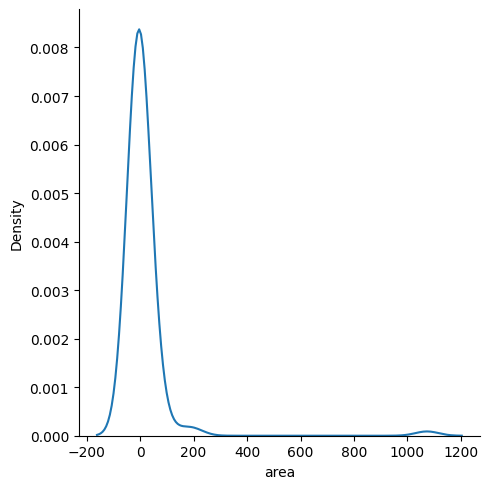

In [38]:
LinearReg(x_train, x_test, y_train, y_test)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Species  159 non-null    object 
 1   Weight   159 non-null    float64
 2   Length1  159 non-null    float64
 3   Length2  159 non-null    float64
 4   Length3  159 non-null    float64
 5   Height   159 non-null    float64
 6   Width    159 non-null    float64
dtypes: float64(6), object(1)
memory usage: 8.8+ KB
                Weight      Length1      Length2      Length3       Height  \
Weight   128148.475121  3276.882797  3524.013253  3836.368648  1111.413300   
Length1    3276.882797    99.928837   107.073431   115.136248    26.795457   
Length2    3524.013253   107.073431   114.839688   123.685458    29.416988   
Length3    3836.368648   115.136248   123.685458   134.797808    35.004389   
Height     1111.413300    26.795457    29.416988    35.004389    18.371576   
Width       534.990098    14.61155

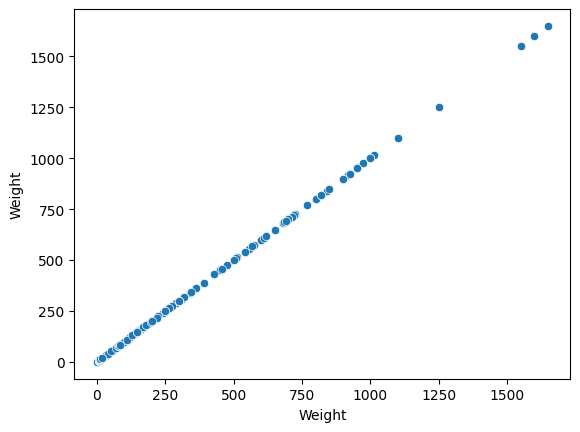

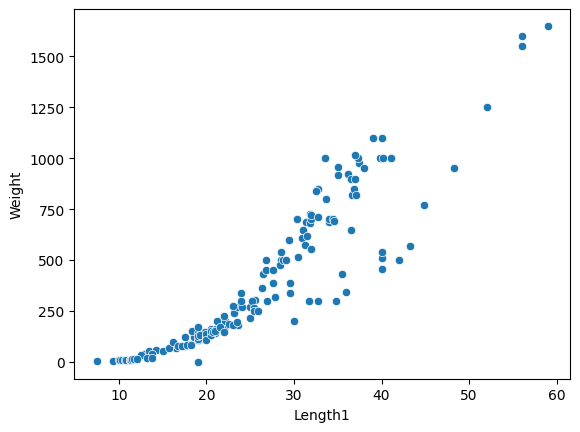

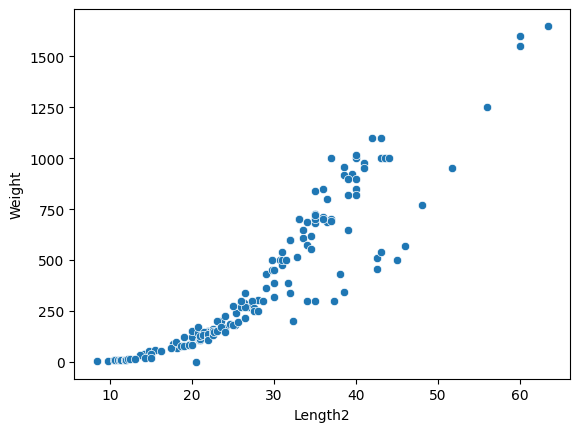

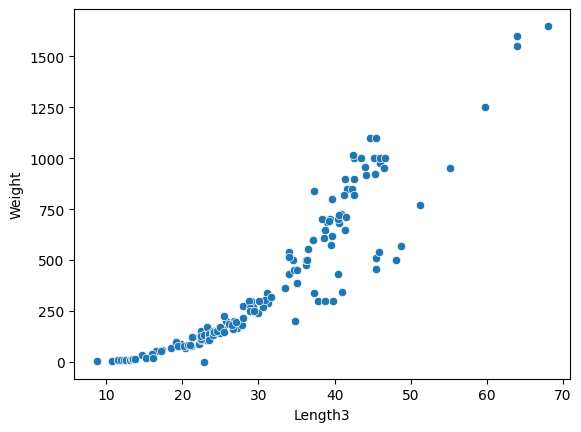

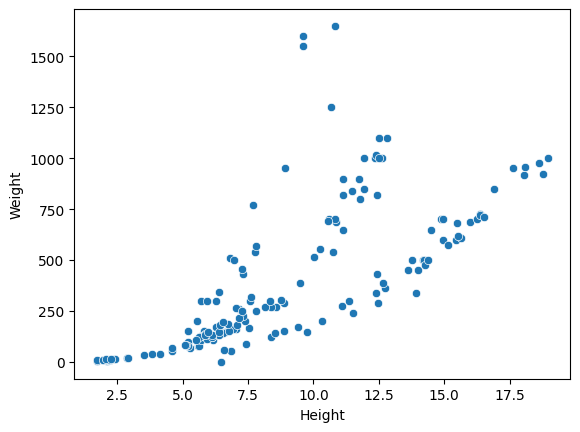

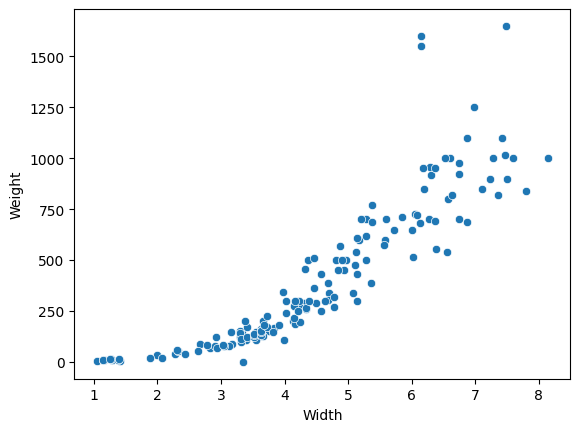

   Length1  Length2  Length3   Height   Width
0     23.2     25.4     30.0  11.5200  4.0200
1     24.0     26.3     31.2  12.4800  4.3056
2     23.9     26.5     31.1  12.3778  4.6961
3     26.3     29.0     33.5  12.7300  4.4555
4     26.5     29.0     34.0  12.4440  5.1340
0    242.0
1    290.0
2    340.0
3    363.0
4    430.0
Name: Weight, dtype: float64
[[ 3.17091789e+00  3.13904375e+00  2.98953375e+00  1.65693045e-01
   1.08366267e+00]
 [ 7.32808723e-01  7.00466821e-01  7.34116902e-01 -6.72599948e-01
   2.51889882e-02]
 [ 4.92137003e-01  5.05380667e-01  6.89366567e-01  1.36936060e+00
   5.67178524e-01]
 [-3.86837976e-01 -3.72507027e-01 -4.56241991e-01 -3.62187165e-01
  -3.72671033e-01]
 [ 1.25897428e-01  8.59454356e-02 -4.45389154e-02 -2.95326914e-01
   1.76176084e-01]
 [ 6.07240869e-01  6.51695282e-01  8.14667504e-01  1.52090593e+00
   5.63990350e-01]
 [ 8.68840565e-01  7.98009898e-01  6.89366567e-01  3.96592013e-01
   1.44266306e+00]
 [-5.96117732e-01 -5.67593181e-01 -6.35243328

In [39]:
Fish = pd.read_csv('Fishersmaket.csv')
Fish.head()
Fish.info()
Fish.drop(columns=['Species'],inplace=True)
x_train, x_test, y_train, y_test=eda(Fish,'Weight')


[ 768.18191068 -245.15462174 -352.26645998  140.76964662   39.95247052]
379.7968503937011
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 107.79739817234851
Mean Squared Error: 26027.715029777788
Root Mean Squared Error: 161.331072734851


(array([ 472.38317189,  161.20821592,  223.58860394,  184.37961353,
         634.2210248 ,  783.03240113,  680.63881667,  503.57500422,
         895.0222029 ,  139.68644481,  356.25875688,  656.72012191,
         778.89520907,  896.40229382,   51.58150919,   92.00766574,
         208.44717103, 1059.59461179,  167.63848938,  682.50393368,
          43.78341609,  497.84924105,  173.23150825, 1164.47228424,
         119.36346106,  515.92438501,  661.67078627,  298.10059021,
         784.8464419 , -147.62147464,  628.37160911,  168.42731311]),
 7       390.0
 40        0.0
 95      170.0
 45      160.0
 110     556.0
 120     900.0
 59      800.0
 131     300.0
 33      975.0
 83      115.0
 128     200.0
 134     456.0
 60     1000.0
 126    1000.0
 62       60.0
 37       78.0
 44      145.0
 142    1600.0
 85      130.0
 26      720.0
 61       55.0
 54      390.0
 86      120.0
 144    1650.0
 63       90.0
 8       450.0
 24      700.0
 56      270.0
 119     850.0
 148       9.7
 19 

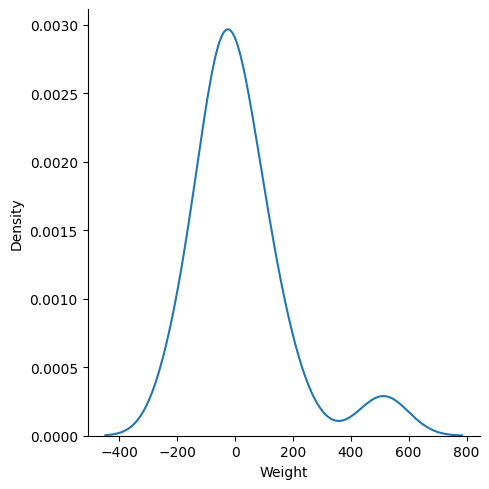

In [40]:
LinearReg(x_train, x_test, y_train, y_test)


In [41]:
energy_efficiency = pd.read_excel('ENB2012_data.xlsx')
energy_efficiency.head()


,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28


              X1            X2            X3            X4            X5  \
X1  1.118887e-02 -9.242069e+00 -9.403911e-01 -4.150839e+00  1.533246e-01   
X2 -9.242069e+00  7.759164e+03  7.512907e+02  3.503937e+03 -1.323703e+02   
X3 -9.403911e-01  7.512907e+02  1.903270e+03 -5.759896e+02  2.146545e+01   
X4 -4.150839e+00  3.503937e+03 -5.759896e+02  2.039963e+03 -7.691786e+01   
X5  1.533246e-01 -1.323703e+02  2.146545e+01 -7.691786e+01  3.066493e+00   
X6  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
X7  1.574143e-18 -2.658745e-15  4.574061e-17 -1.970899e-15 -2.894975e-19   
X8 -1.852784e-17 -4.861706e-14  0.000000e+00  1.541516e-14  0.000000e+00   
Y1  6.641610e-01 -5.849415e+02  2.005866e+02 -3.927640e+02  1.571567e+01   
Y2  6.383312e-01 -5.639665e+02  1.772672e+02 -3.706169e+02  1.492301e+01   

              X6            X7            X8          Y1          Y2  
X1  0.000000e+00  1.574143e-18 -1.852784e-17    0.664161    0.638331  
X2  0.000000e+00 -2.6

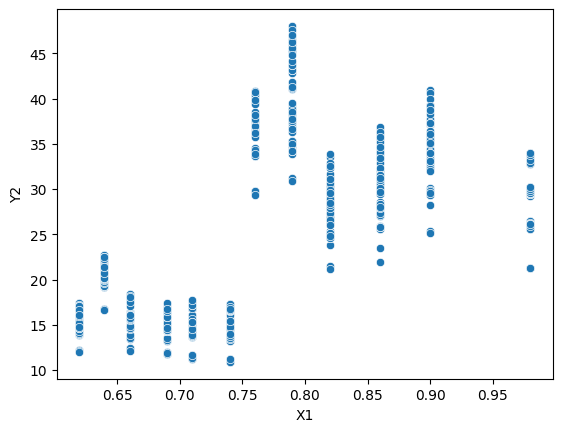

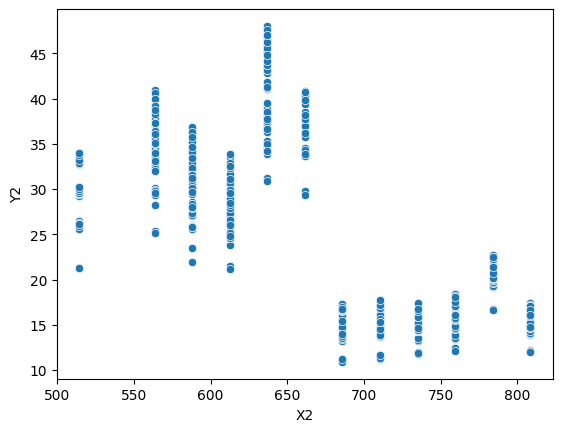

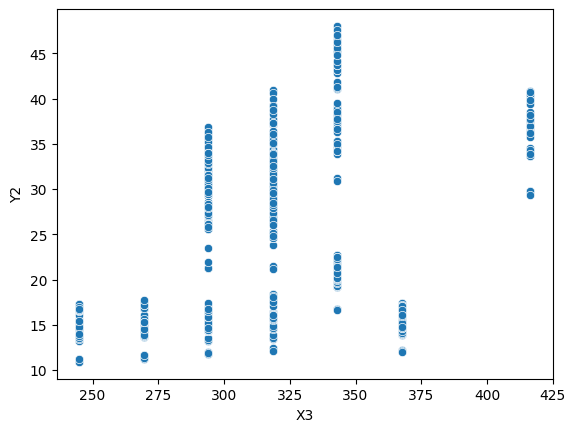

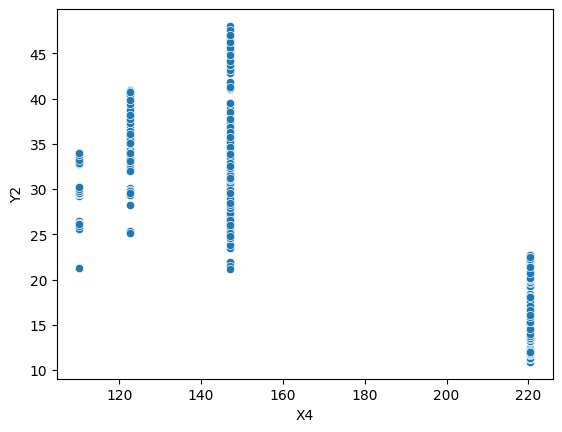

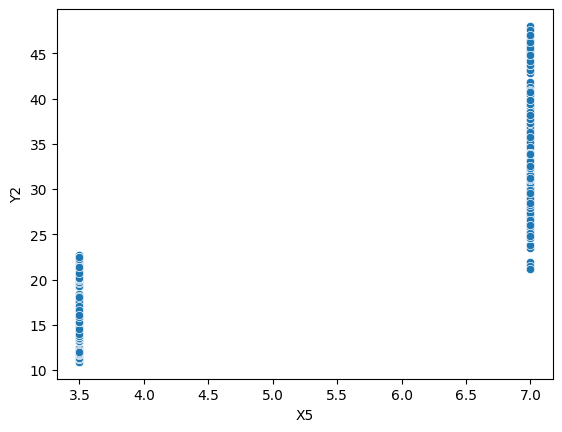

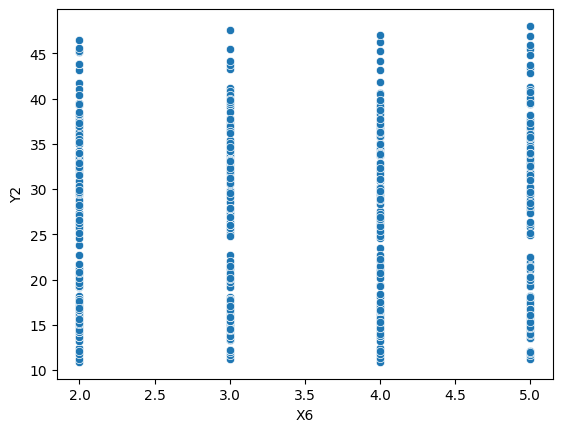

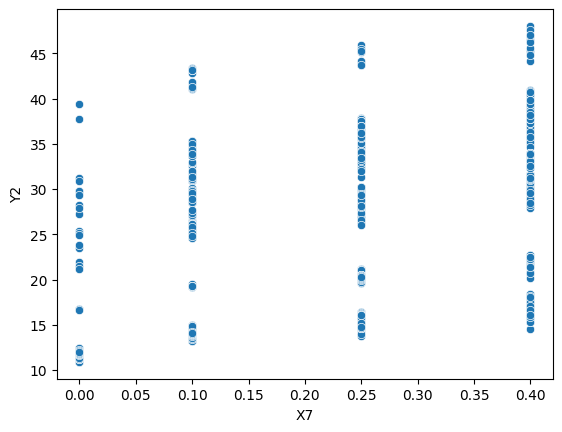

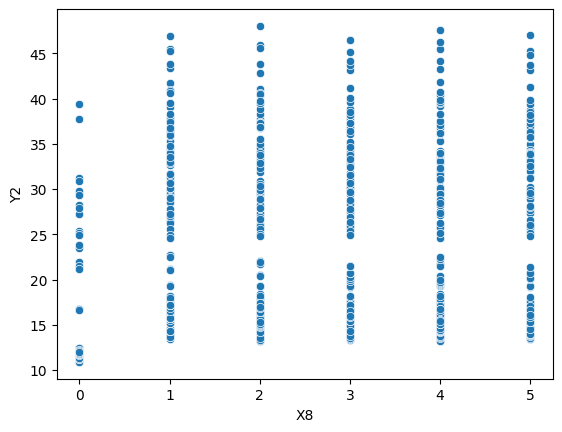

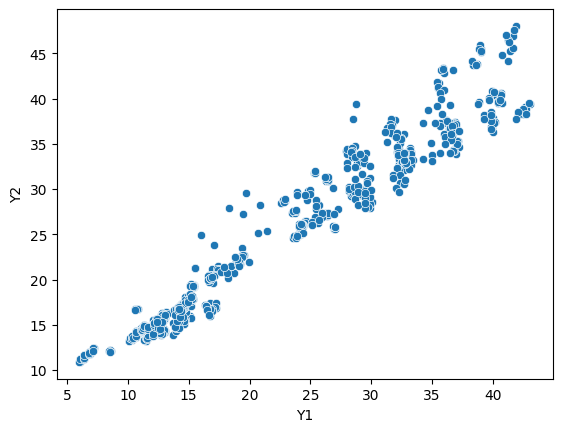

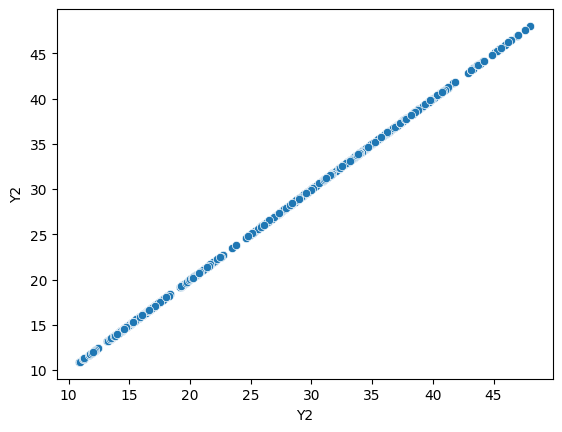

     X1     X2     X3      X4   X5  X6   X7  X8     Y1
0  0.98  514.5  294.0  110.25  7.0   2  0.0   0  15.55
1  0.98  514.5  294.0  110.25  7.0   3  0.0   0  15.55
2  0.98  514.5  294.0  110.25  7.0   4  0.0   0  15.55
3  0.98  514.5  294.0  110.25  7.0   5  0.0   0  15.55
4  0.90  563.5  318.5  122.50  7.0   2  0.0   0  20.84
0    21.33
1    21.33
2    21.33
3    21.33
4    28.28
Name: Y2, dtype: float64
[[-0.21097567  0.14290418 -1.70954366 ...  1.2313237  -0.52246447
  -0.7702471 ]
 [-0.02075678 -0.13564555  2.27290548 ... -1.02661384 -0.52246447
   1.09732135]
 [ 1.31077545 -1.24984447 -0.00277975 ... -1.02661384  1.42173665
   0.68609521]
 ...
 [ 1.31077545 -1.24984447 -0.00277975 ...  1.2313237   0.12560257
   1.28086862]
 [-0.49630401  0.42145391 -1.14062236 ...  1.2313237  -1.17053151
  -0.76222318]
 [ 0.54989989 -0.69274501 -0.00277975 ...  1.2313237   0.77366961
   0.6770683 ]]
[[-0.97185123  0.97855337 -0.00277975 ...  1.2313237   0.12560257
  -0.70204374]
 [-0.21097567  0.

In [42]:
x_train, x_test, y_train, y_test=eda(energy_efficiency,'Y2')


[-1.48382337 -0.55183294 -0.59463806 -0.25480469  1.31847804  0.17916475
 -0.31331209 -0.1800305   8.76996912]
24.518143322475574
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 1.4575821111403895
Mean Squared Error: 3.9720481077560152
Root Mean Squared Error: 1.9929997761555356


(array([17.23682447, 14.29477044, 39.13210958, 21.96657562, 33.11514517,
        30.6081665 , 29.92509064, 31.02192374, 31.7772761 , 26.96597807,
        11.40892569, 43.31229504, 14.38937202, 43.56164914, 42.20886726,
        29.44242017, 14.6054616 , 30.89196606, 16.91163761, 15.44351738,
        15.26661694, 33.39430218, 14.18179741, 39.76894589, 11.16090095,
        17.17449636, 15.81398477, 16.51146843, 14.88278624, 40.58002832,
        15.14512013, 15.60601797, 41.66473132, 15.74907839, 29.98092841,
        36.77635834, 16.35777945, 36.27912879, 19.09818644, 14.3498293 ,
        14.79522529, 41.32390509, 17.19378724, 28.4192468 , 23.8136267 ,
        26.67543028, 17.00218065, 15.29103797, 31.05751184, 34.54388497,
        33.1426268 , 15.85919399, 34.26164337, 16.64821863, 37.50412136,
        14.6347615 , 19.47662502, 29.5498025 , 41.38425023, 16.77878405,
        16.99394529, 15.31695631, 33.01715878, 13.96234734, 15.87685228,
        14.8027244 , 40.61482751, 14.12572244, 28.4

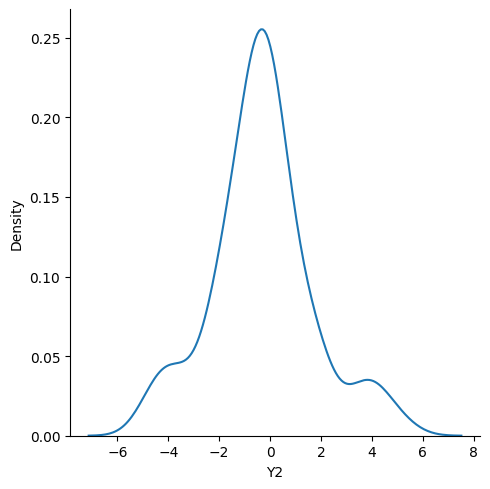

In [43]:
LinearReg(x_train, x_test, y_train, y_test)


In [44]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
concrete_compressive_strength = fetch_ucirepo(id=165) 
  
# data (as pandas dataframes) 
X = concrete_compressive_strength.data.features 
y = concrete_compressive_strength.data.targets 
df_Concrete = pd.concat([X, y], axis=1)
df_Concrete.head()


,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


                                     Cement  Blast Furnace Slag      Fly Ash  \
Cement                         10921.580220        -2481.550406 -2658.299034   
Blast Furnace Slag             -2481.550406         7444.124812 -1786.685054   
Fly Ash                        -2658.299034        -1786.685054  4095.616541   
Water                           -182.073210          197.604130  -351.195911   
Superplasticizer                  57.677098           22.302400   144.322455   
Coarse Aggregate                -888.546203        -1905.221719   -49.565280   
Fine Aggregate                 -1866.130628        -1947.995145   405.907450   
Age                              540.979608         -241.152238  -624.071384   
Concrete compressive strength    869.143022          194.337561  -113.064425   

                                    Water  Superplasticizer  Coarse Aggregate  \
Cement                        -182.073210         57.677098       -888.546203   
Blast Furnace Slag             197.60

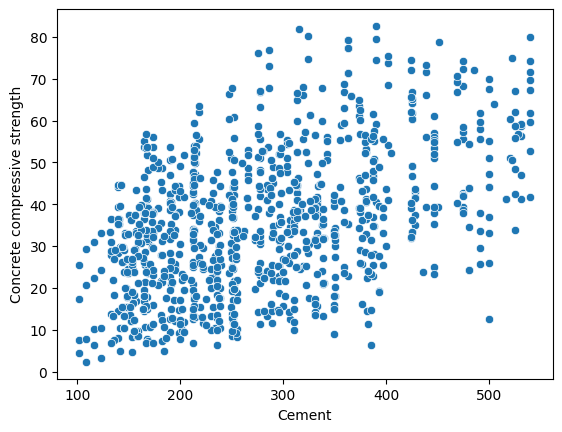

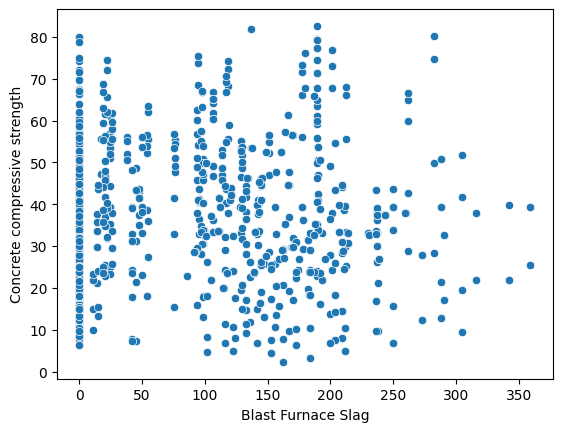

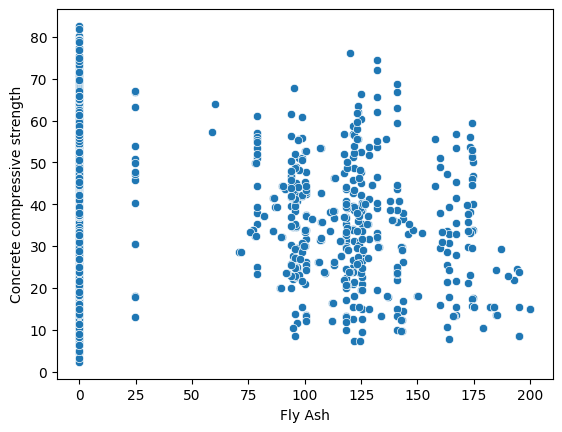

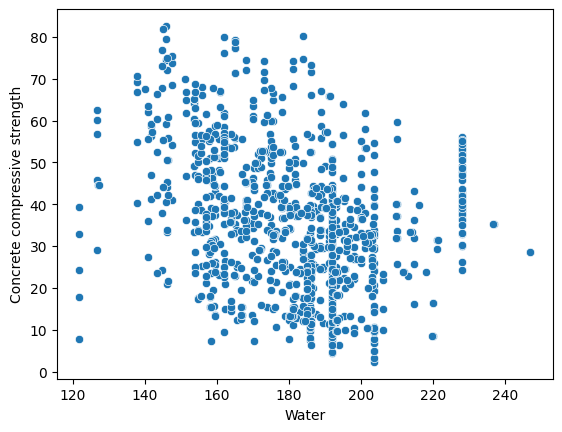

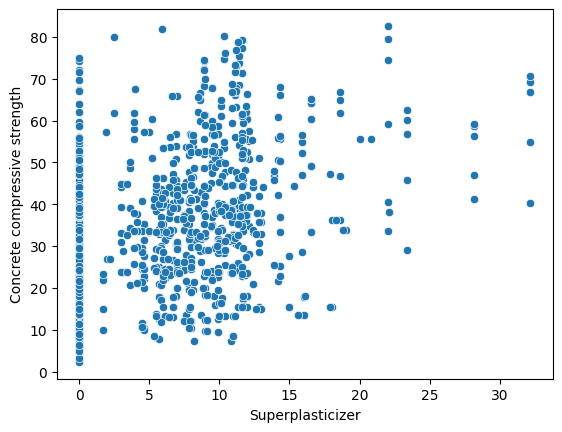

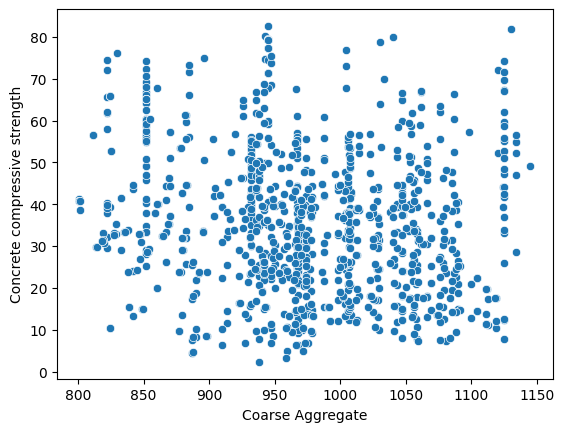

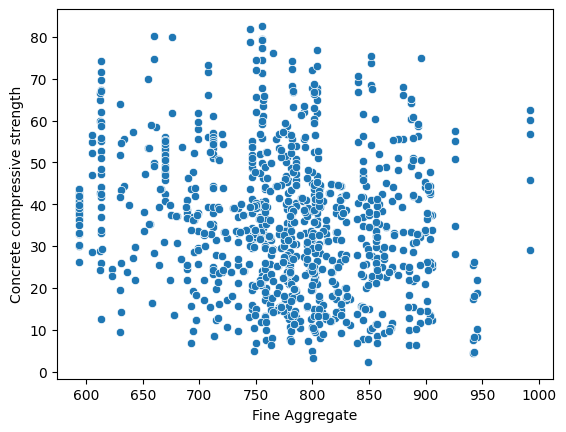

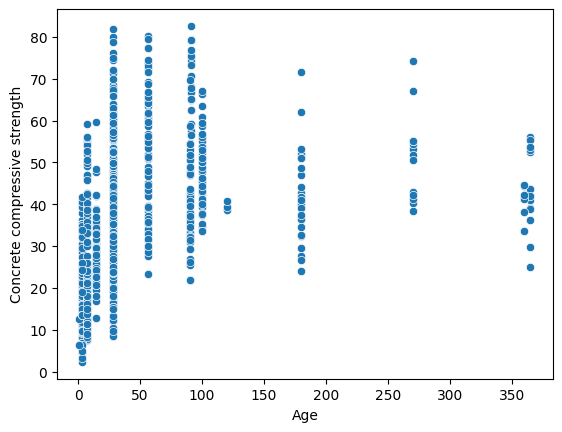

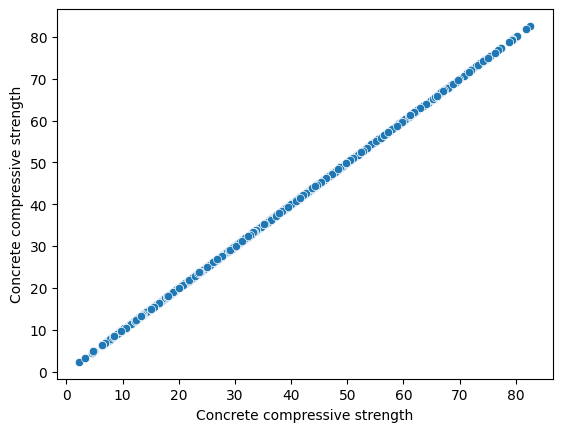

   Cement  Blast Furnace Slag  Fly Ash  Water  Superplasticizer  \
0   540.0                 0.0      0.0  162.0               2.5   
1   540.0                 0.0      0.0  162.0               2.5   
2   332.5               142.5      0.0  228.0               0.0   
3   332.5               142.5      0.0  228.0               0.0   
4   198.6               132.4      0.0  192.0               0.0   

   Coarse Aggregate  Fine Aggregate  Age  
0            1040.0           676.0   28  
1            1055.0           676.0   28  
2             932.0           594.0  270  
3             932.0           594.0  365  
4             978.4           825.5  360  
0    79.99
1    61.89
2    40.27
3    41.05
4    44.30
Name: Concrete compressive strength, dtype: float64
[[ 1.91868084 -0.88106284 -0.8461832  ... -0.46017905 -0.64352249
  -0.2880169 ]
 [ 0.91473491 -0.88106284 -0.8461832  ...  0.85205772 -0.18717261
  -0.2880169 ]
 [ 0.23205168  0.70441979 -0.8461832  ... -0.98121424 -0.62502182
  -0

In [45]:
x_train, x_test, y_train, y_test=eda(df_Concrete,'Concrete compressive strength')


[12.4707515   9.60167889  5.87663436 -3.10942845  1.88214401  1.7298186
  1.82305303  7.11727713]
36.10087378640777
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 7.864641991336005
Mean Squared Error: 95.61717380589968
Root Mean Squared Error: 9.778403438491361


(array([39.16168311, 14.61985573, 61.44006681, 53.77704184, 24.66843056,
        53.44824826, 46.03635103, 27.0142886 , 52.97935681, 37.7669688 ,
        16.78225173, 39.38067954, 29.58730029, 35.96292876, 47.58040332,
        56.53181108, 35.48381341, 29.5710143 , 48.31448876, 35.09926523,
        53.50039223, 32.6381569 , 32.78602889, 47.85367457, 23.52304214,
        23.49824614, 69.33646719, 26.46234841, 56.53181108, 48.29138728,
        18.94539881, 36.73148524, 17.69801487, 19.85998727, 24.52854945,
        15.47194289, 52.98743408, 27.88380095, 27.4939795 , 26.11003546,
        52.37737924, 30.70653948, 25.82766787, 35.35266432, 53.49326786,
        53.8372625 , 30.32994344, 43.74067457, 27.35645723, 58.28754017,
        36.82214048, 19.22345154, 23.43042034, 34.65625636, 43.6473197 ,
        47.10177114, 35.7974068 , 52.89594742, 59.94305049, 36.71267139,
        31.10289845, 20.48477624, 50.42617421, 55.43315971, 20.76926652,
        44.38078706, 33.34490777, 34.20513117, 19.3

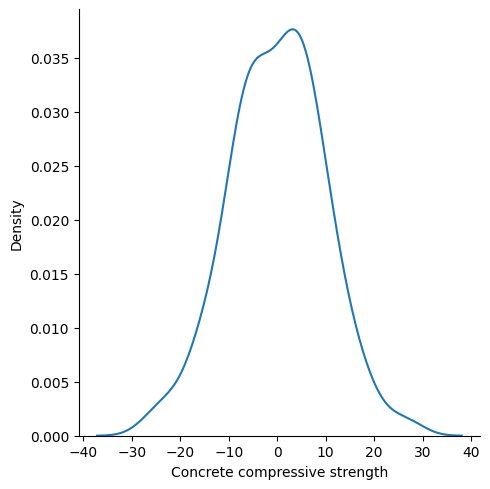

In [46]:
LinearReg(x_train, x_test, y_train, y_test)


In [47]:
# fetch dataset 
student_performance = fetch_ucirepo(id=320) 
  
# data (as pandas dataframes) 
X = student_performance.data.features 
y = student_performance.data.targets 
df_student_performance = pd.concat([X, y], axis=1)
df_student_performance.head()
#df_student_performance.info()
df_student_performance = df_student_performance.select_dtypes(exclude=['object'])

df_student_performance.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   age         649 non-null    int64
 1   Medu        649 non-null    int64
 2   Fedu        649 non-null    int64
 3   traveltime  649 non-null    int64
 4   studytime   649 non-null    int64
 5   failures    649 non-null    int64
 6   famrel      649 non-null    int64
 7   freetime    649 non-null    int64
 8   goout       649 non-null    int64
 9   Dalc        649 non-null    int64
 10  Walc        649 non-null    int64
 11  health      649 non-null    int64
 12  absences    649 non-null    int64
 13  G1          649 non-null    int64
 14  G2          649 non-null    int64
 15  G3          649 non-null    int64
dtypes: int64(16)
memory usage: 81.3 KB


In [48]:
df_student_performance.head()


,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,18,4,4,2,2,0,4,3,4,1,1,3,4,0,11,11
1,17,1,1,1,2,0,5,3,3,1,1,3,2,9,11,11
2,15,1,1,1,2,0,4,3,2,2,3,3,6,12,13,12
3,15,4,2,1,3,0,3,2,2,1,1,5,0,14,14,14
4,16,3,3,1,2,0,4,3,2,1,2,5,0,11,13,13


                 age      Medu      Fedu  traveltime  studytime  failures  \
age         1.483859 -0.149028 -0.162192    0.031454  -0.008503  0.231222   
Medu       -0.149028  1.287208  0.808005   -0.225156   0.091294 -0.115907   
Fedu       -0.162192  0.808005  1.209848   -0.171520   0.045985 -0.108262   
traveltime  0.031454 -0.225156 -0.171520    0.560492  -0.039220  0.043405   
studytime  -0.008503  0.091294  0.045985   -0.039220   0.688086 -0.072555   
failures    0.231222 -0.115907 -0.108262    0.043405  -0.072555  0.351928   
famrel     -0.023935  0.026479  0.021293   -0.006812  -0.003272 -0.035518   
freetime   -0.006287 -0.023476  0.007909    0.000737  -0.060012  0.067963   
goout       0.161564  0.012721  0.035810    0.050574  -0.073579  0.031442   
Dalc        0.151827 -0.007364  0.000062    0.064270  -0.105549  0.058128   
Walc        0.135111 -0.028803  0.054312    0.054816  -0.228982  0.062682   
health     -0.015415  0.007571  0.071442   -0.052255  -0.067701  0.030534   

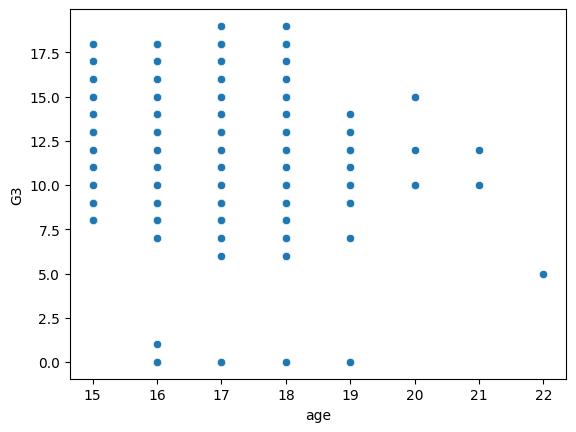

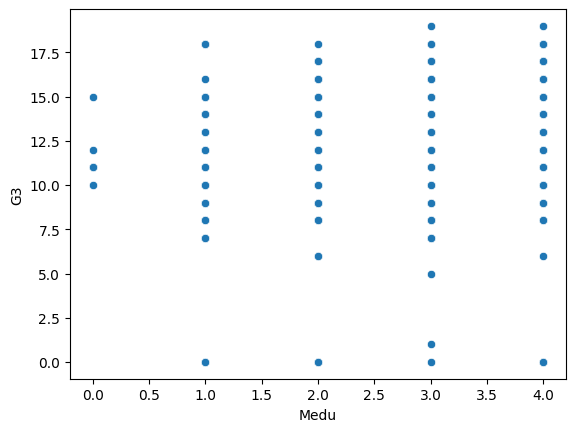

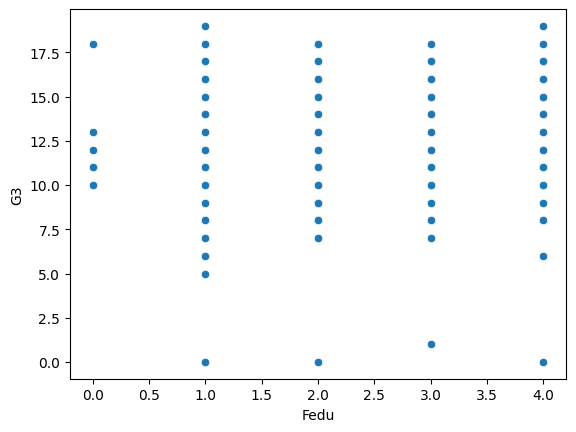

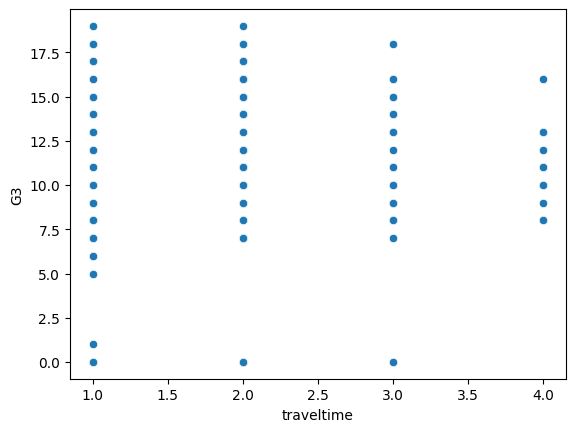

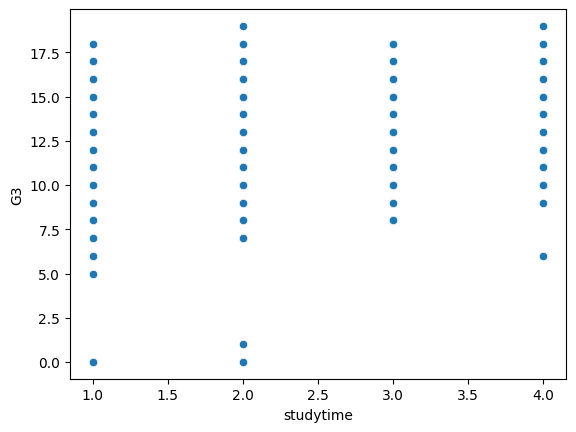

...

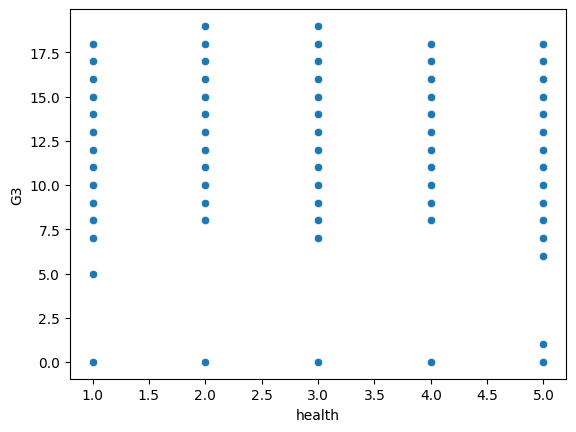

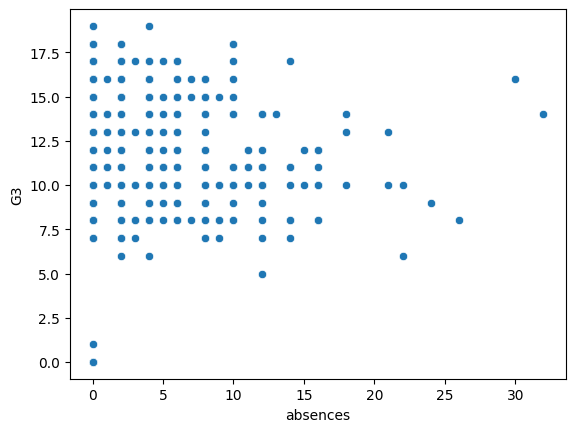

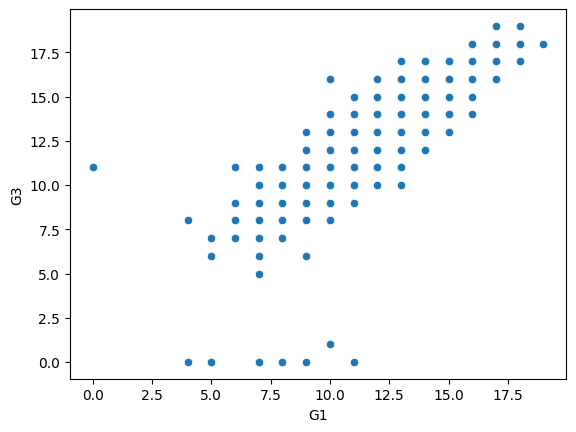

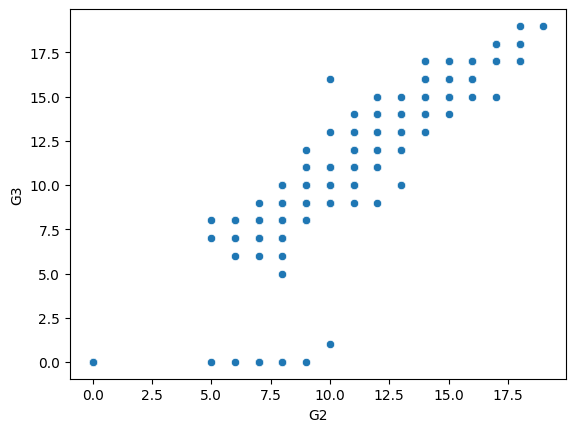

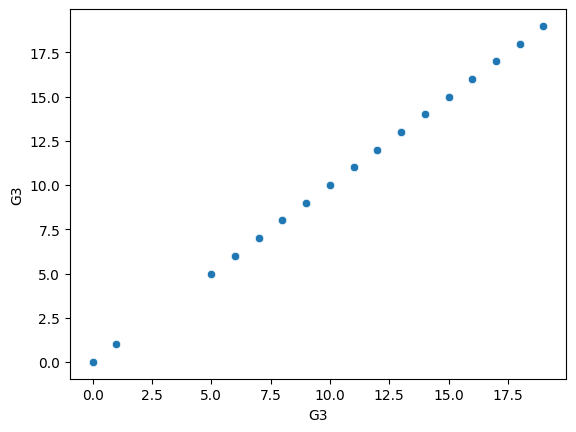

   age  Medu  Fedu  traveltime  studytime  failures  famrel  freetime  goout  \
0   18     4     4           2          2         0       4         3      4   
1   17     1     1           1          2         0       5         3      3   
2   15     1     1           1          2         0       4         3      2   
3   15     4     2           1          3         0       3         2      2   
4   16     3     3           1          2         0       4         3      2   

   Dalc  Walc  health  absences  G1  G2  
0     1     1       3         4   0  11  
1     1     1       3         2   9  11  
2     2     3       3         6  12  13  
3     1     1       5         0  14  14  
4     1     2       5         0  11  13  
0    11
1    11
2    12
3    14
4    13
Name: G3, dtype: int64
[[-0.61043136  0.42368083 -0.27799922 ...  0.03087478  0.23054844
   0.16090933]
 [ 0.20820914 -1.32148068 -1.18543063 ... -0.81249421 -1.93188482
  -1.87596729]
 [ 1.02684965  0.42368083 -0.27799922 ... 

In [49]:
x_train, x_test, y_train, y_test=eda(df_student_performance,'G3')


[ 0.01424542 -0.06853578  0.02393076  0.06840502  0.06023623 -0.15739055
 -0.05797197 -0.03185328  0.00818949 -0.0675809  -0.06855698 -0.03839909
  0.12909789  0.39741405  2.67132683]
11.847784200385357
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 0.7500883580758801
Mean Squared Error: 0.9895409730458784
Root Mean Squared Error: 0.9947567406385736


(array([ 7.38597426, 14.71873929, 16.53018904, 10.27079548,  8.99716454,
        12.61763186, 13.00955153, 18.42056046, 11.84229736, 11.36676808,
        10.64018844, 10.13294342, 13.4724586 ,  8.18041653, 18.52947199,
        12.37877698, 12.80822147, 12.26599267, 10.35402329, 10.35293061,
        12.22225893, 10.06721467, 17.59247381, 13.117286  , 12.46793578,
         0.30842473, 12.29796454, 13.38623744, 11.06950938, 12.76151405,
        13.58638715, 16.62630559, 13.37593998, 16.33371301, 12.81833938,
         8.80721636,  9.44831488, 11.02624373, 12.7110147 , 10.99984585,
        15.60980007, 17.72872272, 11.31154872, 13.41020592, 12.20819454,
         9.28807288, 12.4729717 ,  9.23713166, 11.31528131,  8.93684528,
         5.71284293, 14.61926528,  8.94401632, 12.07358933,  6.8623945 ,
        11.2724859 , 11.49953051, 11.31809844, 14.69263943, 14.50851991,
        13.22284876,  6.98929316, 11.553348  ,  8.83204224, 13.32972366,
        12.50258655, 11.650823  , 13.27461398, 14.7

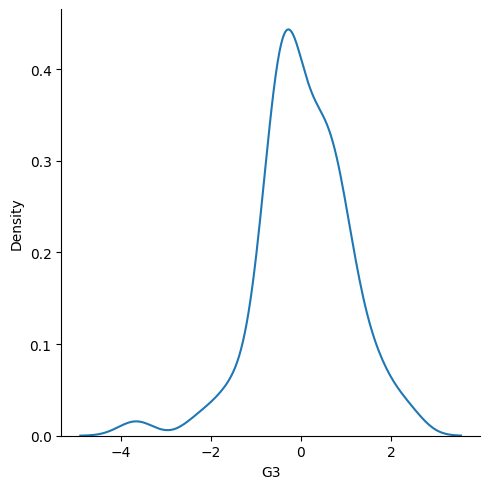

In [50]:
LinearReg(x_train, x_test, y_train, y_test)


In [51]:
df_insurance= pd.read_csv('insurance.csv')
df_insurance['sex'] = df_insurance['sex'].map({'female': 0, 'male': 1})
# Convert 'sex' to numeric (e.g., 0 for female, 1 for male) and boolean
df_insurance['smoker'] = df_insurance['smoker'].map({'no': 0, 'yes': 1})
region_mapping = {'southwest': 0, 'northwest': 1, 'northeast': 2, 'southeast': 3}  # Example mapping
df_insurance['region'] = df_insurance['region'].map(region_mapping)
df_insurance.head()


,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,0,16884.92400
1,18,1,33.770,1,0,3,1725.55230
2,28,1,33.000,3,0,3,4449.46200
3,33,1,22.705,0,0,1,21984.47061
4,32,1,28.880,0,0,1,3866.85520


                   age         sex           bmi    children       smoker  \
age         197.401387   -0.146559      9.362337    0.719303    -0.141903   
sex          -0.146559    0.250160      0.141435    0.010348     0.015383   
bmi           9.362337    0.141435     37.187884    0.093795     0.009233   
children      0.719303    0.010348      0.093795    1.453213     0.003734   
smoker       -0.141903    0.015383      0.009233    0.003734     0.162969   
region       -0.191105    0.008000      1.121306   -0.047872     0.031505   
charges   50874.802298  347.014469  14647.304426  992.674197  3848.667032   

               region       charges  
age         -0.191105  5.087480e+04  
sex          0.008000  3.470145e+02  
bmi          1.121306  1.464730e+04  
children    -0.047872  9.926742e+02  
smoker       0.031505  3.848667e+03  
region       1.278972  1.055121e+03  
charges   1055.120775  1.466524e+08  


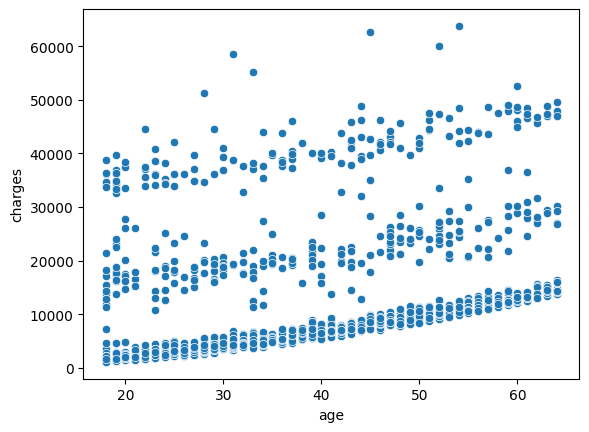

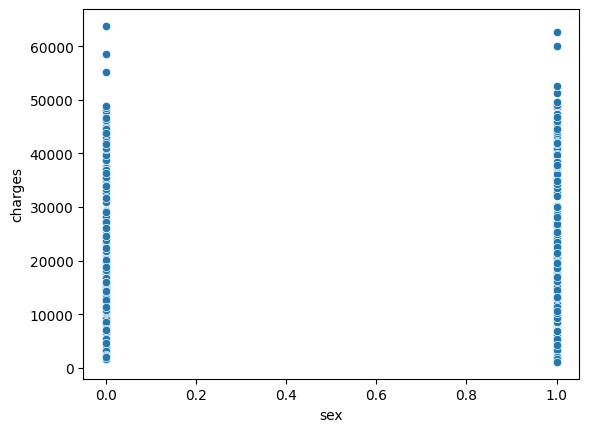

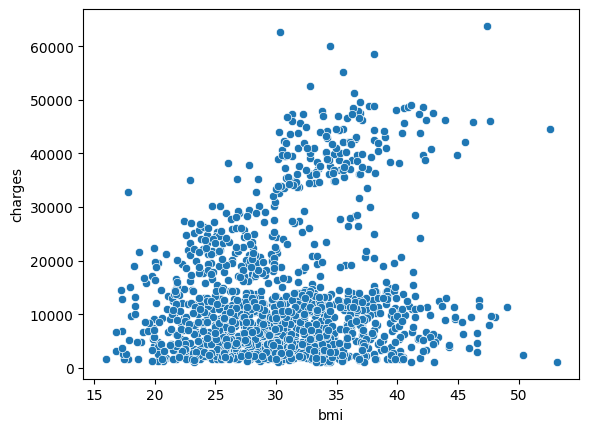

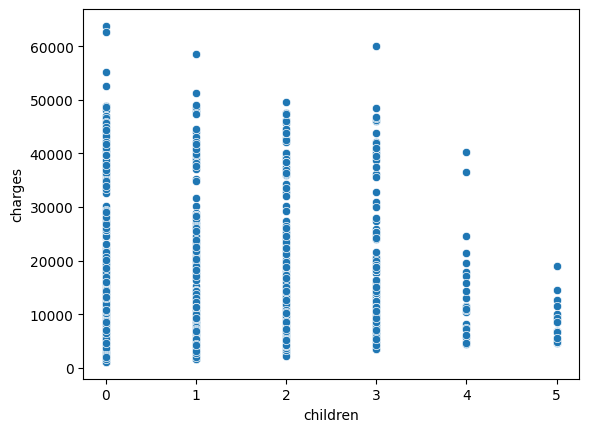

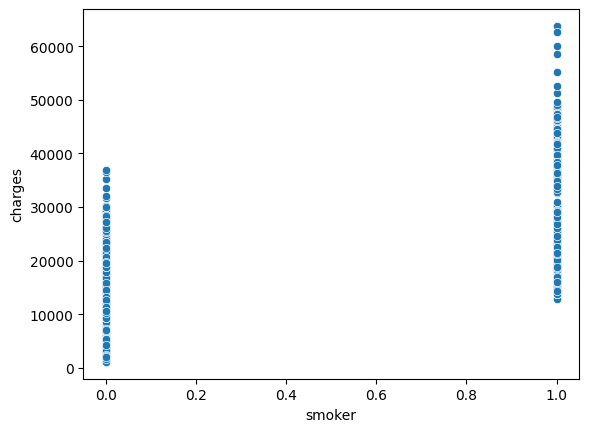

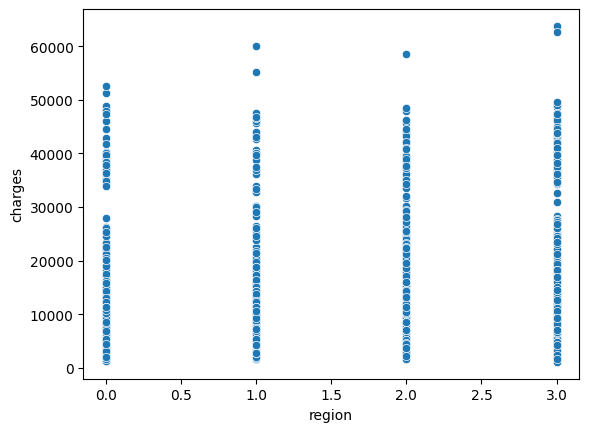

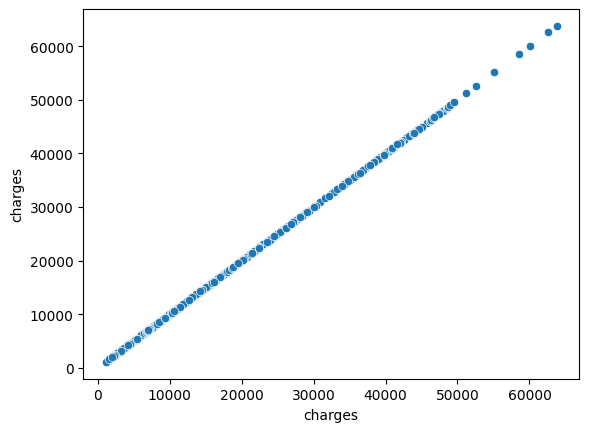

   age  sex     bmi  children  smoker  region
0   19    0  27.900         0       1       0
1   18    1  33.770         1       0       3
2   28    1  33.000         3       0       3
3   33    1  22.705         0       0       1
4   32    1  28.880         0       0       1
0    16884.92400
1     1725.55230
2     4449.46200
3    21984.47061
4     3866.85520
Name: charges, dtype: float64
[[-0.14853305  1.01506676  0.54530479  2.41394802  1.97125461 -1.33470543]
 [-1.49780784  1.01506676  0.59867181 -0.89219519 -0.50729114  1.2873291 ]
 [-1.14273553 -0.98515688  0.96092064  0.76087642  1.97125461  0.41331759]
 ...
 [ 0.06451033  1.01506676 -0.91339361 -0.89219519 -0.50729114  1.2873291 ]
 [-1.42679338  1.01506676  0.77656186 -0.89219519 -0.50729114 -0.46069392]
 [-0.4325909  -0.98515688 -1.97749955 -0.06565939 -0.50729114 -1.33470543]]
[[ 0.91668389  1.01506676 -0.08539629 -0.06565939 -0.50729114 -1.33470543]
 [ 0.56161157 -0.98515688 -0.21962242 -0.06565939 -0.50729114  1.2873291 ]
 [ 

In [52]:
x_train, x_test, y_train, y_test=eda(df_insurance,'charges')


[3590.11166645  -11.26839041 1986.48932707  520.08826827 9518.89850626
  -18.32314954]
13201.182056009347
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 3940.5694377280547
Mean Squared Error: 32171277.5238826
Root Mean Squared Error: 5671.972983352671


(array([ 1.14725570e+04,  9.90566438e+03,  3.77894122e+04,  1.59490570e+04,
         6.89105416e+03,  3.58651409e+03,  1.11683834e+03,  1.40708157e+04,
         8.77273944e+03,  7.24022124e+03,  4.13569573e+03,  1.01204725e+04,
         9.10417222e+03,  4.28096214e+03,  2.76998224e+04,  1.11415427e+04,
         1.11773106e+04,  5.54749763e+03,  8.01513961e+03,  2.66010934e+04,
         3.34881251e+04,  1.40916832e+04,  1.12500403e+04,  3.25740909e+04,
         4.49301397e+03,  8.63366041e+03,  7.67041779e+02,  1.01469016e+04,
         4.23045213e+03,  1.01965342e+04,  8.79433682e+03,  4.03166793e+04,
         1.59051950e+04,  1.40884209e+04,  2.43779103e+04,  4.69505778e+03,
         1.28850603e+04,  3.09385456e+04,  3.32698032e+04,  3.90270928e+03,
         3.63065077e+03,  4.40476650e+03,  3.00717903e+04,  3.91791926e+04,
         2.80782340e+04,  4.80221168e+03,  1.10355297e+04,  7.65898168e+03,
         3.20223893e+03,  1.07236171e+04,  5.13828819e+03,  3.19623878e+03,
         3.3

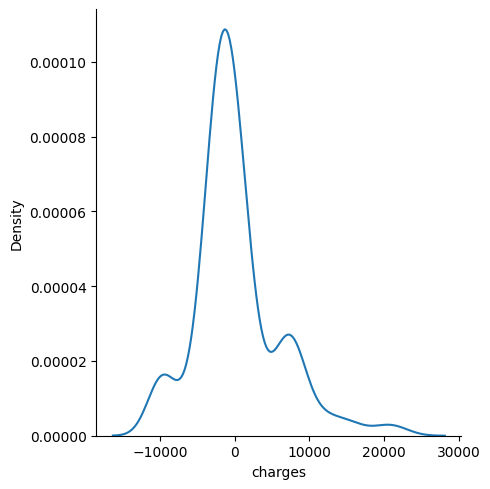

In [53]:
LinearReg(x_train, x_test, y_train, y_test)


In [54]:
communities_and_crime = fetch_ucirepo(id=183) 
  
# data (as pandas dataframes) 
X = communities_and_crime.data.features 
y = communities_and_crime.data.targets 
df_Crime = pd.concat([X, y], axis=1)
df_Crime.head()


,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,?,?,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,?,?,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,?,?,?,?,0.00,?,0.67
2,24,?,?,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,?,?,?,?,0.00,?,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,?,?,?,?,0.00,?,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,?,?,?,?,0.00,?,0.03


In [55]:
df_Crime.info(verbose=True,max_cols=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Data columns (total 128 columns):
 #    Column                 Dtype  
---   ------                 -----  
 0    state                  int64  
 1    county                 object 
 2    community              object 
 3    communityname          object 
 4    fold                   int64  
 5    population             float64
 6    householdsize          float64
 7    racepctblack           float64
 8    racePctWhite           float64
 9    racePctAsian           float64
 10   racePctHisp            float64
 11   agePct12t21            float64
 12   agePct12t29            float64
 13   agePct16t24            float64
 14   agePct65up             float64
 15   numbUrban              float64
 16   pctUrban               float64
 17   medIncome              float64
 18   pctWWage               float64
 19   pctWFarmSelf           float64
 20   pctWInvInc             float64
 21   pctWSocSec             float64
 22 

In [56]:
df_Crime = df_Crime.select_dtypes(exclude=['object'])


                          state      fold  population  householdsize  \
state                268.879739 -0.134620   -0.165579      -0.132899   
fold                  -0.134620  8.258117   -0.002754       0.016696   
population            -0.165579 -0.002754    0.016105      -0.000959   
householdsize         -0.132899  0.016696   -0.000959       0.026803   
racepctblack          -0.191808  0.002567    0.007435      -0.002785   
...                         ...       ...         ...            ...   
LandArea              -0.072423  0.005614    0.009913      -0.000270   
PopDens               -0.459367 -0.007336    0.005977      -0.000135   
PctUsePubTrans        -0.080495 -0.000356    0.007859      -0.001931   
LemasPctOfficDrugUn   -0.296760 -0.016423    0.014223      -0.003713   
ViolentCrimesPerPop   -0.807619 -0.021811    0.010856      -0.001332   

                     racepctblack  racePctWhite  racePctAsian  racePctHisp  \
state                   -0.191808      0.856315     -1.09

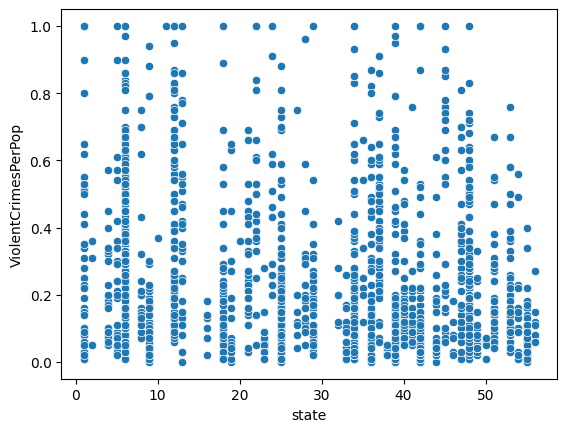

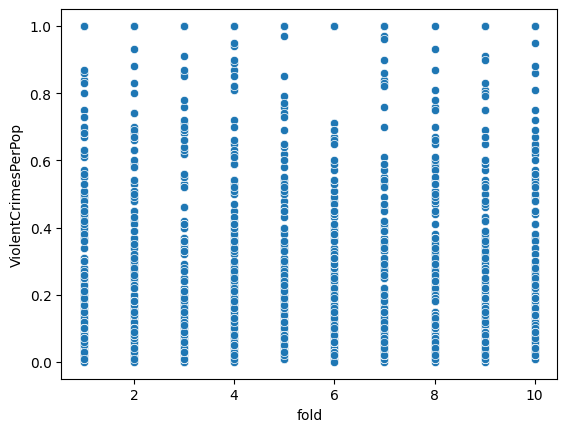

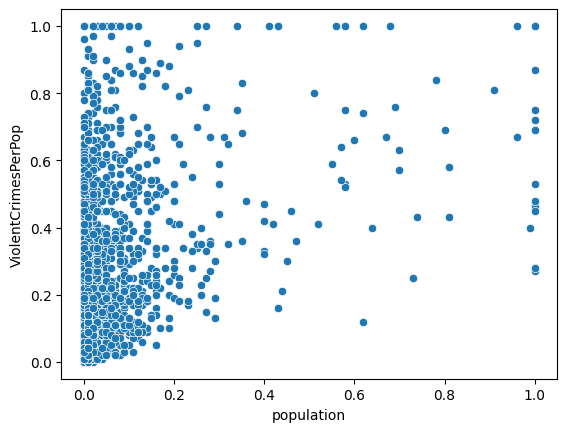

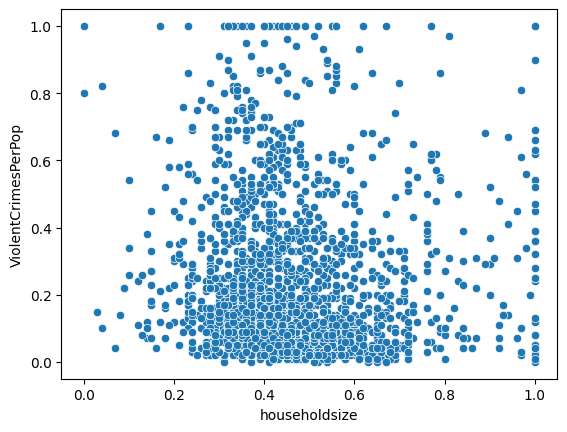

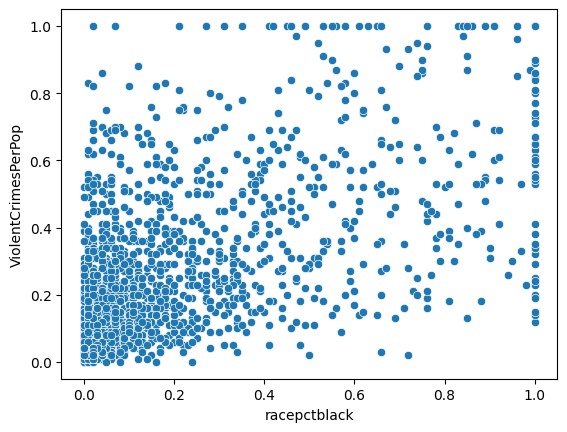

...

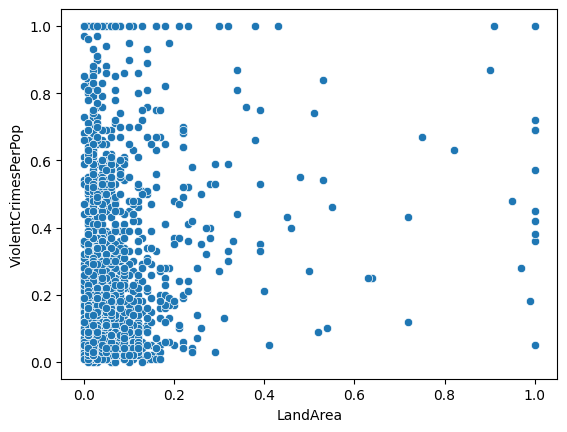

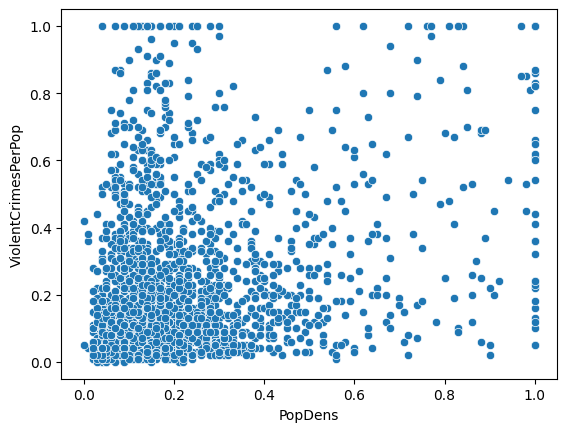

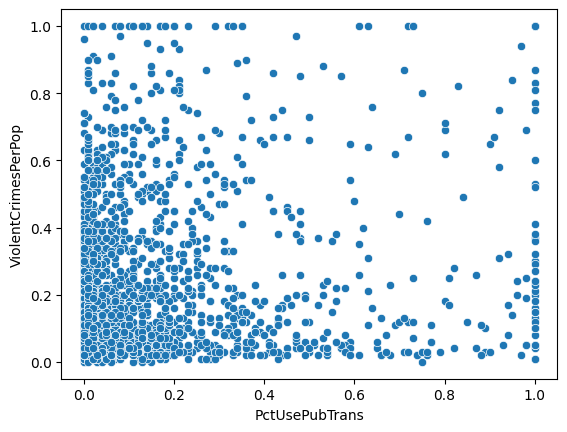

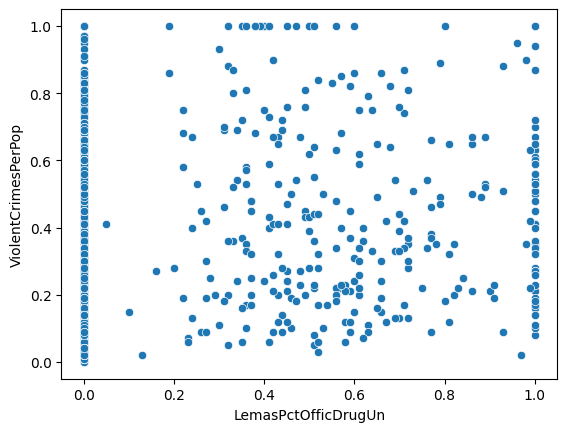

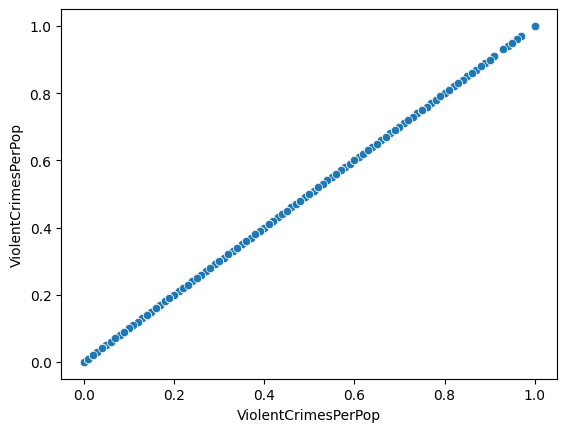

   state  fold  population  householdsize  racepctblack  racePctWhite  \
0      8     1        0.19           0.33          0.02          0.90   
1     53     1        0.00           0.16          0.12          0.74   
2     24     1        0.00           0.42          0.49          0.56   
3     34     1        0.04           0.77          1.00          0.08   
4     42     1        0.01           0.55          0.02          0.95   

   racePctAsian  racePctHisp  agePct12t21  agePct12t29  ...  NumStreet  \
0          0.12         0.17         0.34         0.47  ...        0.0   
1          0.45         0.07         0.26         0.59  ...        0.0   
2          0.17         0.04         0.39         0.47  ...        0.0   
3          0.12         0.10         0.51         0.50  ...        0.0   
4          0.09         0.05         0.38         0.38  ...        0.0   

   PctForeignBorn  PctBornSameState  PctSameHouse85  PctSameCity85  \
0            0.12              0.42           

In [57]:
x_train, x_test, y_train, y_test=eda(df_Crime,'ViolentCrimesPerPop')


[-0.011382   -0.00485548  0.02110085  0.00656508  0.05529218 -0.01047704
 -0.00390531  0.01798386  0.02177835 -0.02820009 -0.027311    0.01651981
 -0.0266842   0.01969933 -0.07437922 -0.02082794  0.00630244 -0.02044279
  0.01803761  0.01230719 -0.01308626  0.07372977  0.01140902 -0.04700385
 -0.00452565 -0.00400782  0.0056285   0.00434442  0.01040288 -0.04707375
 -0.01810163  0.00654197  0.00512     0.00333305  0.05090665 -0.0138354
 -0.01051731  0.01990423  0.0275857   0.0591971   0.03011234 -0.01328883
 -0.04343394 -0.01127471 -0.03968397 -0.03817584  0.00368622 -0.00361703
  0.01367075 -0.0400753  -0.01580083  0.02175349 -0.00724742 -0.00785997
  0.02496915 -0.02579269  0.01200486  0.01054123 -0.05597493  0.12122955
 -0.07200186 -0.01811265 -0.03225616 -0.0028408  -0.03496238  0.0696699
  0.00628286 -0.03363113 -0.10917697  0.04357567  0.01922255  0.00659236
  0.02697514 -0.01023382  0.09034283  0.01643104 -0.00998557 -0.00353114
  0.00302174 -0.00786636 -0.0903639   0.08826438 -0.0

(array([ 1.34765090e-01,  9.14954268e-02,  2.71343134e-01,  1.25315821e-01,
         1.57492103e-01,  2.80585154e-01,  4.42592567e-01,  2.17405811e-01,
         2.94041010e-01,  1.03173729e-01,  4.93330640e-02,  5.22306300e-01,
         6.81734933e-02,  6.60345896e-02,  3.76708430e-01,  2.15351822e-01,
         2.13664017e-01,  2.02402680e-01,  4.28951574e-01,  4.41170341e-01,
         7.94790117e-03,  7.17554481e-01,  2.62846932e-01,  5.11504512e-01,
         1.03714878e-01,  3.06608762e-01,  1.65338293e-01,  1.48736221e-01,
         4.09318921e-02,  3.46791851e-01,  6.65778880e-02,  3.15237843e-01,
         1.79809273e-01,  5.78268416e-02,  2.92282115e-01,  6.63610986e-01,
         3.86920842e-01,  3.95780217e-03,  2.74465211e-01,  3.06552765e-01,
         1.14585396e-01,  2.23379603e-02,  7.40471643e-02,  5.20152415e-02,
        -1.34090001e-01,  1.96942301e-01,  2.01422681e-01,  4.11268795e-01,
         1.46659336e-01,  4.27548925e-05,  4.59953332e-01,  5.52958291e-01,
         3.0

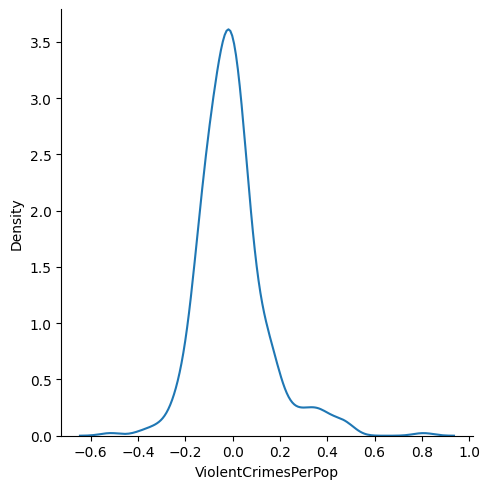

In [58]:
LinearReg(x_train, x_test, y_train, y_test)


In [59]:
auto_mpg = fetch_ucirepo(id=9) 
  
# data (as pandas dataframes) 
X = auto_mpg.data.features 
y = auto_mpg.data.targets 
df_auto_mpg = pd.concat([X, y], axis=1)
df_auto_mpg.fillna(df_auto_mpg.mean(), inplace=True)


In [60]:
df_auto_mpg.head()


,displacement,cylinders,horsepower,weight,acceleration,model_year,origin,mpg
0,307.0,8,130.0,3504,12.0,70,1,18.0
1,350.0,8,165.0,3693,11.5,70,1,15.0
2,318.0,8,150.0,3436,11.0,70,1,18.0
3,304.0,8,150.0,3433,12.0,70,1,16.0
4,302.0,8,140.0,3449,10.5,70,1,17.0


              displacement    cylinders    horsepower         weight  \
displacement  10872.199152   168.623214   3559.413587   82368.423240   
cylinders       168.623214     2.893415     54.511746    1290.695575   
horsepower     3559.413587    54.511746   1459.177916   27838.432016   
weight        82368.423240  1290.695575  27838.432016  717140.990526   
acceleration   -156.332976    -2.370842    -72.080867    -974.899011   
model_year     -142.717137    -2.193499    -58.144194    -959.946344   
origin          -50.964989    -0.767477    -13.899450    -394.639330   
mpg            -655.402318   -10.308911   -230.323549   -5505.211745   

              acceleration  model_year      origin          mpg  
displacement   -156.332976 -142.717137  -50.964989  -655.402318  
cylinders        -2.370842   -2.193499   -0.767477   -10.308911  
horsepower      -72.080867  -58.144194  -13.899450  -230.323549  
weight         -974.899011 -959.946344 -394.639330 -5505.211745  
acceleration      7.6

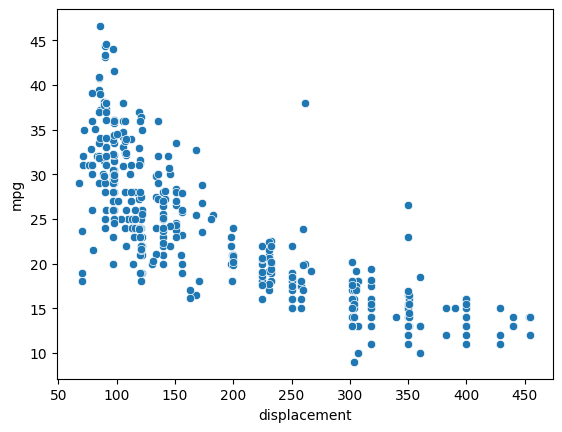

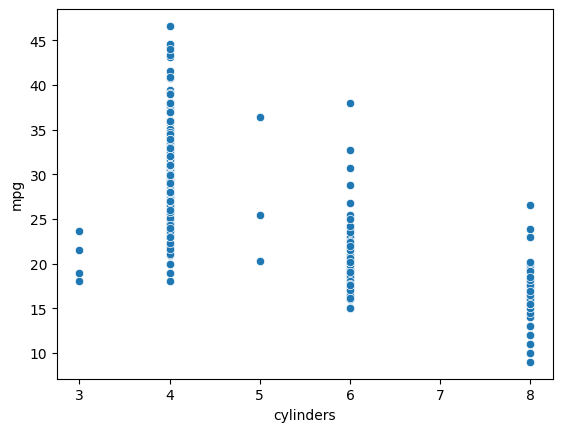

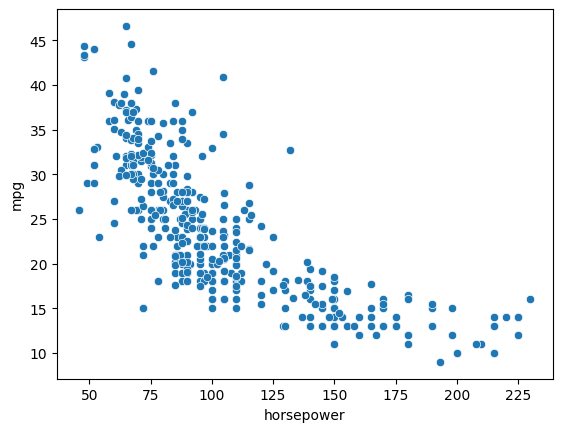

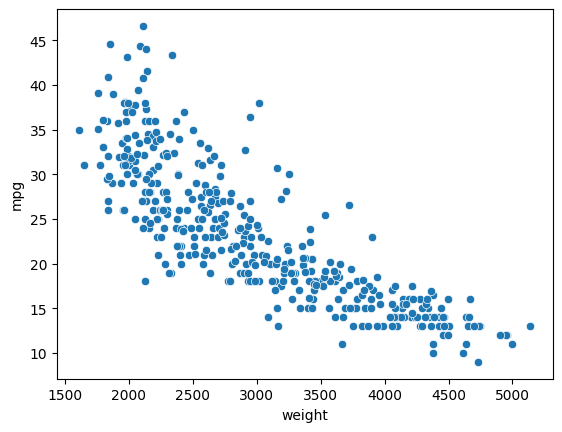

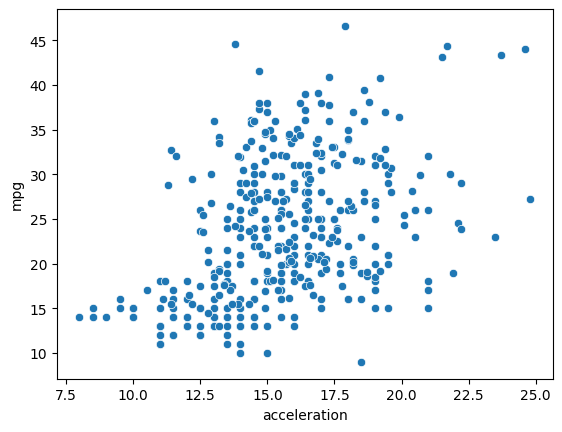

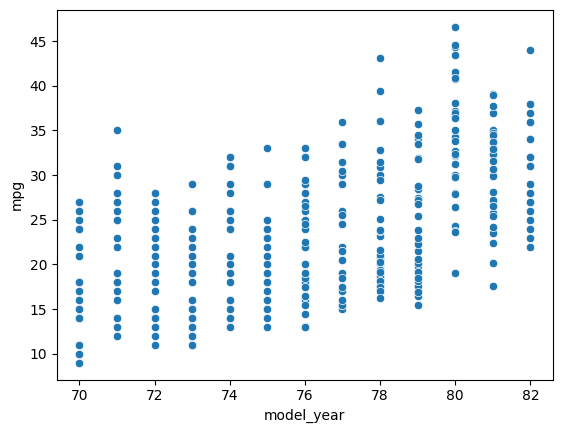

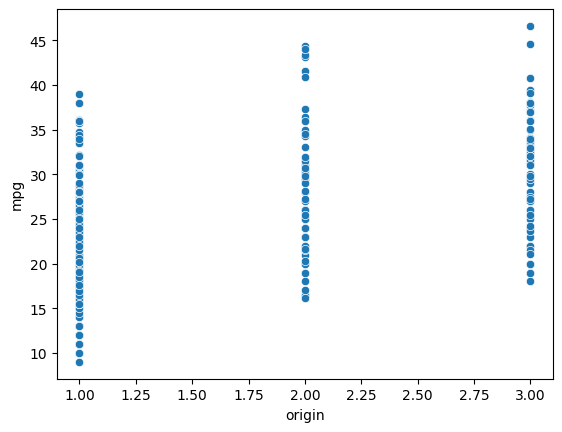

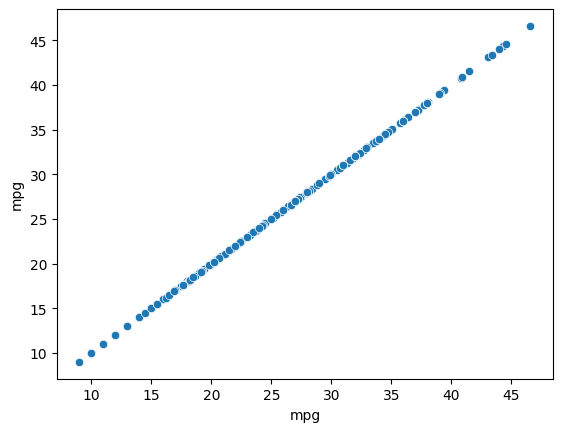

   displacement  cylinders  horsepower  weight  acceleration  model_year  \
0         307.0          8       130.0    3504          12.0          70   
1         350.0          8       165.0    3693          11.5          70   
2         318.0          8       150.0    3436          11.0          70   
3         304.0          8       150.0    3433          12.0          70   
4         302.0          8       140.0    3449          10.5          70   

   origin  
0       1  
1       1  
2       1  
3       1  
4       1  
0    18.0
1    15.0
2    18.0
3    16.0
4    17.0
Name: mpg, dtype: float64
[[ 1.22961301  1.49526939  1.23868518 ... -0.79520768 -1.13752513
  -0.73301171]
 [-0.92367663 -0.85285735 -1.16990273 ...  1.24411524 -1.41177304
   0.5068698 ]
 [-0.92367663 -0.85285735 -0.68818515 ...  0.05760009  1.05645814
   0.5068698 ]
 ...
 [-1.206235   -0.85285735 -1.4642857  ...  1.42950823 -0.86327722
   0.5068698 ]
 [ 0.56706235  0.32120602 -0.09941922 ... -0.2390287  -1.41177304


In [61]:
x_train, x_test, y_train, y_test=eda(df_auto_mpg,'mpg')


[ 2.19832026 -0.68191436 -0.75056758 -5.43340525  0.52291497  2.71826274
  1.2637639 ]
23.5748427672956
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
Mean Absolute Error: 2.711643065576289
Mean Squared Error: 11.49595782738201
Root Mean Squared Error: 3.390568953344263


(array([12.93919229, 24.07211587, 11.67010561, 21.14976743, 17.40952717,
        29.80876671, 33.27918748, 23.62733752, 14.24877581, 26.46229018,
        32.95207054, 33.97404015, 21.44002854, 26.76343952, 16.18534504,
        30.33227682, 28.76481791, 28.92151255, 17.49698038, 30.64411093,
        15.55585581, 24.72624432, 27.0404037 , 19.99573952, 29.26698254,
        28.24177705, 30.60843748, 30.31542085, 29.21847724, 18.27188017,
        20.7599458 , 31.19511783, 21.47866445, 32.1697562 , 23.88250051,
        25.69232383, 21.37890266, 16.97704853, 31.74526274,  8.86176117,
        10.08437709, 13.70211466, 26.08020548, 29.99060813, 31.44063907,
        22.44214823, 23.05196138, 13.56678592, 22.07356182, 27.93020193,
        31.30877662, 26.56141808, 15.37864555, 24.85514597, 14.85467774,
         8.359196  , 19.47671801, 26.19813014, 30.0799211 , 14.55326389,
        21.18935916, 24.81602264, 22.0163343 , 18.96573731, 10.64173028,
        11.9734927 , 10.26839795, 19.67251514, 24.0

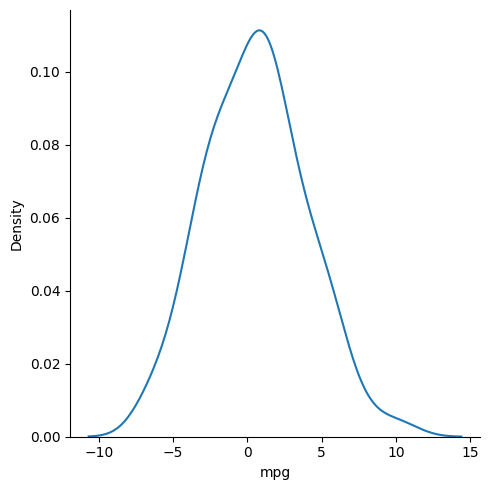

In [62]:
LinearReg(x_train, x_test, y_train, y_test)
